In [1]:
import numpy as np
from matplotlib import pyplot as plt
import importlib.util
spec = importlib.util.spec_from_file_location("models", "/home/pbromley/mnist_test/models.py")
models = importlib.util.module_from_spec(spec)
spec.loader.exec_module(models)
import seaborn as sns
from itertools import compress
from matplotlib import transforms

In [2]:
# Load pytorch modules
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import Dataset, TensorDataset, DataLoader
import torchvision.datasets as dset
import torchvision.utils as vutils
import torch.autograd as autograd
import torch.nn.functional as F

In [3]:
# Some other helpful modules
import time
from Bio.Seq import Seq
from Bio.Alphabet import single_letter_alphabet
from Bio.SeqRecord import SeqRecord
from Bio import SeqIO

## MNIST Proof of Concept



Basic setup for GAN + Activation Maximization pipeline used in DGN-AM, PPGN, and Generative DNA.  First train a generative model (GAN in this case) to map latent *z* vectors to the data manifold.  Then define a differentiable function that picks up characteristics of the data (trained conv-net classifier in this case).  Finally, map *z* to *X'* (synthetic data point) and *X'* to *class* and use simple gradient search to optimize *z* to highly activate *class*.  Perform optimization by calculating gradient of classifier w.r.t. *z* and stepping up the gradient until convergence.  Note: *class* refers to the layer BEFORE the softmax.  Don't optimize via the post-softmax class because one way to drive up the post-softmax activation of one class is to drive down the post-softmax activations of the other classes, which is not necessarily what we want.

*Hyperparameters*

In [ ]:
GAN_LR = 0.0002
CONV_LR = 0.0001
BETA1 = 0.5
BETA2 = 0.99
BATCH_SIZE = 64
Z_SIZE = 100
GAN_EPOCHS = 50
CONV_EPOCHS = 50

*Data*

In [ ]:
dataset = dset.MNIST(root="/home/pbromley/mnist_test/mnist_data_for_test/", download=True,
#                      transform=transforms.Compose([
#                          transforms.Resize(28),
#                          transforms.ToTensor(),
#                          transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                     )
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=4)

*Image Grid Plotting*

In [13]:
def plot_grid(imgs, n):
    _, ax = plt.subplots(n, n, figsize=(25, 25))
    for i in range(n):
        for j in range(n):
            ax[i][j].imshow(imgs[i*n+j].squeeze(), cmap='gray')

##### *MNIST DCGAN*

*Train DCGAN*

In [ ]:
G = models.generator().to("cuda")
D = models.discriminator().to("cuda")

criterion = nn.BCELoss().to("cuda")

for l in [G, D]:
    l.apply(models.weights_init)

optD = optim.Adam(D.parameters(), lr=GAN_LR, betas=(BETA1, BETA2))
optG = optim.Adam(G.parameters(), lr=GAN_LR, betas=(BETA1, BETA2))

label = torch.zeros(BATCH_SIZE).to("cuda")
z = torch.zeros(BATCH_SIZE, Z_SIZE).to("cuda")

for epoch in range(GAN_EPOCHS):
    for i, batch in enumerate(dataloader):
        
        x, _ = batch
        x = x.to("cuda")
        
        if x.size(0) == BATCH_SIZE:
            optD.zero_grad()
            label.fill_(1)
            pred_real = D(x)
            d_loss_real = criterion(pred_real, label)
            d_loss_real.backward()

            z.normal_(0, 1)
            fake = G(z)
            pred_fake = D(fake.detach())
            label.fill_(0)
            d_loss_fake = criterion(pred_fake, label)
            d_loss_fake.backward()
            optD.step()

            optG.zero_grad()
            pred_g = D(fake)
            label.fill_(1)
            g_loss = criterion(pred_g, label)
            g_loss.backward()
            optG.step()
            
    d_loss_total = d_loss_real + d_loss_fake
    print('Epoch:{0}, Dloss: {1}, Gloss: {2}'.format(epoch, d_loss_total.item(), g_loss.item()))
            

*Plot generated images*

In [ ]:
noise = torch.zeros(BATCH_SIZE, Z_SIZE).normal_(0, 1)
G.to("cpu")
gen = G(noise).data.numpy()

plot_grid(gen, 8)

##### *ConvNet Classifier Model*

*Train ConvNet*

In [ ]:
model = models.convnet().to("cuda")
opt = optim.Adam(model.parameters(), lr=CONV_LR)
criterion = nn.CrossEntropyLoss().to("cuda")

for epoch in range(CONV_EPOCHS):
    for i, batch in enumerate(dataloader):
        x, c = batch
        x, c = x.to("cuda"), c.long().to("cuda")
        opt.zero_grad()
        pred = model(x)
        loss = criterion(pred, c)
        loss.backward()
        opt.step()
        
    print('Epoch{0}, Loss: {1}'.format(epoch, loss.item()))

*Save Models*

In [ ]:
g_path = "/home/pbromley/mnist_test/saved_models/g.pth"
torch.save(G.state_dict(), g_path)
conv_path = "/home/pbromley/mnist_test/saved_models/conv.pth"
torch.save(model.state_dict(), conv_path)

##### Activation Optimization of Latent Vectors

*Load pretrained generator and convnet if needed*

In [4]:
G = models.generator()
G.load_state_dict(torch.load("/home/pbromley/mnist_test/saved_models/g.pth"))
model = models.convnet()
model.load_state_dict(torch.load("/home/pbromley/mnist_test/saved_models/conv.pth"))
G.to("cuda")
model.to("cuda")

convnet(
  (net): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Dropout(p=0.3)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): ReLU(inplace)
    (5): Dropout(p=0.3)
    (6): Conv2d(128, 10, kernel_size=(7, 7), stride=(1, 1))
    (7): Softmax()
  )
)

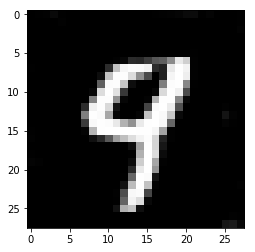

In [66]:
opt_z = torch.zeros(1, 100).normal_(0, 1).cuda().requires_grad_()
start = G(opt_z).cpu().detach().numpy()
plt.imshow(start.squeeze(), cmap="gray")


*Perform the activation optimization (first block is a manual gradient descent without using a built in PyTorch optimizer, second block uses Adam).  Recall that we use all of the layers of the convnet model except the last, since the last layer is the softmax.  Set the **save** variable to true to save the progress of an image throughout the optimization.  Change the index number by "pred.squeeze()" in the loss line to change the target class.  It is fun to experiment with different loss objectives to see how the optimization changes (i.e. optimize for multiple classes at once, negatively optimize for classes, optimize for all classes, etc.*

In [ ]:
### Manually perform gradient descent
imgs = []
save = True
G.eval()
model.eval()
m = nn.Sequential(*list(model.net.children())[:-1])       # Grab everything but last layer of model
m.eval()
for i in range(64):
    if save:
        imgs.append(opt_z[0].clone())
    G.zero_grad()
    m.zero_grad()
    img = G(opt_z)
    pred = m(img)
    loss = -(pred.squeeze()[:, 5]).mean()
    loss.backward()
    with torch.no_grad():
        grad = opt_z.grad
        grad /= (grad**2).mean().sqrt() + 1e-5            # Normalize gradient
        opt_z -= 0.01 * grad
        opt_z.grad.zero_()
    

In [67]:
optimizer = optim.Adam([opt_z], lr=0.001)
h = opt_z.register_hook(lambda grad: grad + torch.zeros_like(grad).normal_(0, 1e-5))
G.eval()
model.eval()
m = nn.Sequential(*list(model.net.children())[:-1])       # Grab everything but last layer of model
m.eval()
imgs = []
save = True
for i in range(3200):
    if save:
        if i%50==0:
            imgs.append(opt_z[0].clone())
    G.zero_grad()
    m.zero_grad()
    optimizer.zero_grad()
    img = G(opt_z)
    pred = m(img)
    loss = -(pred.squeeze()[5])
    loss.backward()
    optimizer.step()
    


*Now we have 81 optimized **z** vectors that supposedly maximize our specified activations.  Observe the generated images of the new latent vectors*

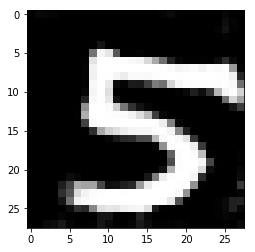

In [68]:
after = G(opt_z).cpu().detach().numpy()
plt.imshow(after.squeeze(), cmap="gray")

*If saved image progress, use this block to plot those images*

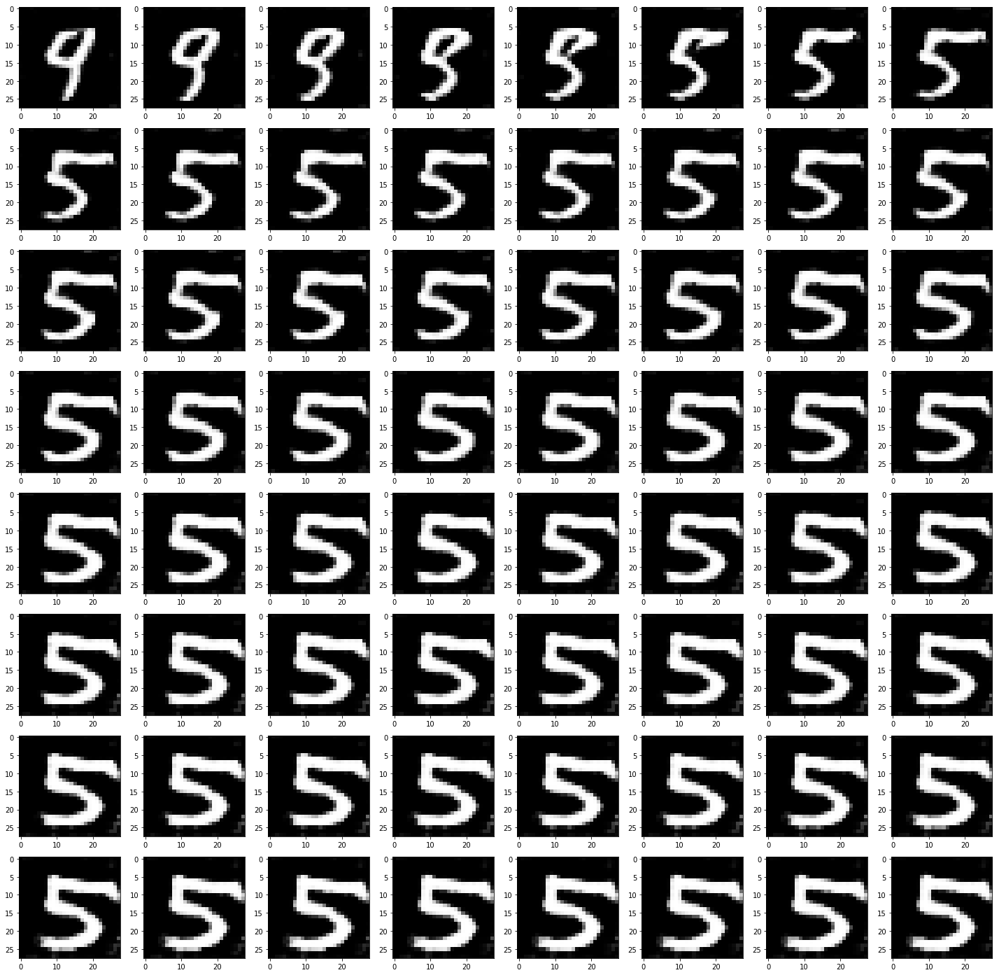

In [69]:
# For plotting sequence of saved imgs
saved = G(torch.stack(imgs)).cpu().detach().numpy()
plot_grid(saved, 8)

## Activation Maximization applied to DHSs

Using the same method as above, first create a GAN model that captures the data distribution of the DHS sequences accurately.  Already have the Spectral Norm model working reasonably well, but would also like to try the 1d resnet architecture that is used in the Generative DNA and Feedback GAN papers.

In [5]:
import gen_models
# import gan_trainer
import data_helper
import importlib
import utils
# importlib.reload(data_helper)

In [8]:
G = gen_models.snp_generator_2d_temp_2a(50, 320, 11)
G.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/no-condition-ms-g.pth"))
G.train(False)
G.to("cuda")

snp_generator_2d_temp_2a(
  (fc): Linear(in_features=50, out_features=1600, bias=True)
  (relu1): ReLU(inplace)
  (bn1): BatchNorm2d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up1): ConvTranspose2d(160, 320, kernel_size=(10, 1), stride=(10, 10), bias=False)
  (relu2): ReLU(inplace)
  (bn2): BatchNorm2d(320, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up2): ConvTranspose2d(320, 1, kernel_size=(11, 4), stride=(1, 1), padding=(5, 0))
  (softmax): Softmax()
)

In [ ]:
# For 1d
G = gen_models.resnet_generator_1d()
G.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/no-condition-strong2-g.pth"))
G.train(False)
G.to("cuda")

In [17]:
# G = gen_models.snp_generator_2d(100, 320, 11)
# G.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/no-condition-2d-g-2.pth"))
# G.train(False)
# G.to("cuda")

In [9]:
# G.to("cpu")
one_hot_seqs = np.zeros((64000, 1, 100, 4))
for i in range(500):
    noise = torch.from_numpy(np.random.normal(0, 1, (128, 50))).float().cuda()
    with torch.no_grad():
        one_hot_seqs[i*128:(i+1)*128] = G(noise).detach().cpu().numpy()

one_hot_seqs = one_hot_seqs.reshape(-1, 100, 4)

print("Converting one-hot to normal...")
seqs = [utils.one_hot_to_seq(one_hot_seq) for one_hot_seq in one_hot_seqs]

Converting one-hot to normal...


In [10]:
utils.calc_overall_composition(seqs)

array([ 26.52234375,  26.564875  ,  23.3788125 ,  23.53396875])

In [15]:
real_one_hot, _, _, _ = data_helper.load_the_data('mean_signal')
real_one_hot_randomized = real_one_hot[np.random.permutation(len(real_one_hot))][:64000]
real_seqs = [utils.one_hot_to_seq(o) for o in real_one_hot_randomized]
utils.calc_overall_composition(real_seqs)

array([ 26.47729688,  26.49203125,  23.5028125 ,  23.52785937])

In [18]:
all_stats_fake = np.zeros((len(seqs), 4))
all_stats_real = np.zeros((len(real_seqs), 4))
for i in range(len(seqs)):
    all_stats_fake[i] = utils.calc_overall_composition([seqs[i]])/100
for i in range(len(real_seqs)):
    all_stats_real[i] = utils.calc_overall_composition([real_seqs[i]])/100

In [19]:
def format_boxes(bp):
    plt.setp(bp['boxes'][0], color='green', linewidth=3)
    plt.setp(bp['caps'][0], color='green', linewidth=3)
    plt.setp(bp['caps'][1], color='green', linewidth=3)
    plt.setp(bp['whiskers'][0], color='green', linewidth=3)
    plt.setp(bp['whiskers'][1], color='green', linewidth=3)
#     plt.setp(bp['fliers'][0], color='green', linewidth=3)
    plt.setp(bp['medians'][0], color='green', linewidth=3)

    plt.setp(bp['boxes'][1], color='blue', linewidth=3)
    plt.setp(bp['caps'][2], color='blue', linewidth=3)
    plt.setp(bp['caps'][3], color='blue', linewidth=3)
    plt.setp(bp['whiskers'][2], color='blue', linewidth=3)
    plt.setp(bp['whiskers'][3], color='blue', linewidth=3)
#     plt.setp(bp['fliers'][1], color='blue')
    plt.setp(bp['medians'][1], color='blue', linewidth=3)
    

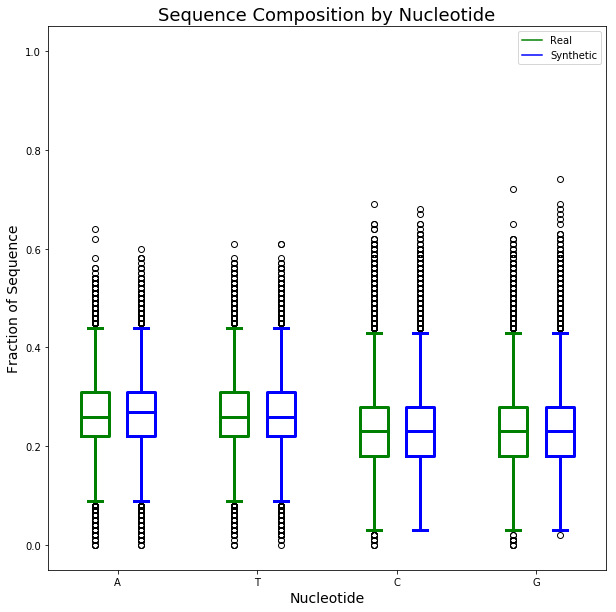

In [20]:
plt.figure(figsize=(10, 10))
bp = plt.boxplot([all_stats_real[:, 0], all_stats_fake[:, 0]], positions = [1, 2], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([all_stats_real[:, 1], all_stats_fake[:, 1]], positions = [4, 5], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([all_stats_real[:, 2], all_stats_fake[:, 2]], positions = [7, 8], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([all_stats_real[:, 3], all_stats_fake[:, 3]], positions = [10, 11], widths = 0.6)
format_boxes(bp)
plt.xlim(0, 12)
plt.xticks([1.5, 4.5, 7.5, 10.5], ["A", "T", "C", "G"])

hB, = plt.plot([1,1],'g-')
hR, = plt.plot([1,1],'b-')
plt.legend((hB, hR),('Real', 'Synthetic'))
hB.set_visible(False)
hR.set_visible(False)

plt.title("Sequence Composition by Nucleotide", fontsize=18)
plt.xlabel("Nucleotide", fontsize=14)
plt.ylabel("Fraction of Sequence", fontsize=14)
plt.show()

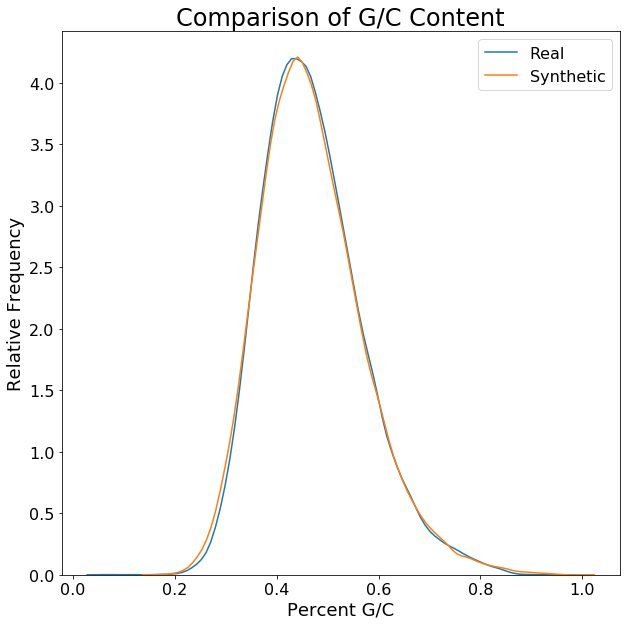

In [76]:
plt.figure(figsize=(10, 10))
sns.distplot(all_stats_real[:, 2:].sum(1), hist=False, label="Real")
sns.distplot(all_stats_fake[:, 2:].sum(1), hist=False, label="Synthetic")
plt.title("Comparison of G/C Content", fontsize=24)
plt.xlabel("Percent G/C", fontsize=18)
plt.ylabel("Relative Frequency", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig("/home/pbromley/generative_dhs/figures/nucleotides/cg.pdf", format='pdf', bbox_inches='tight')

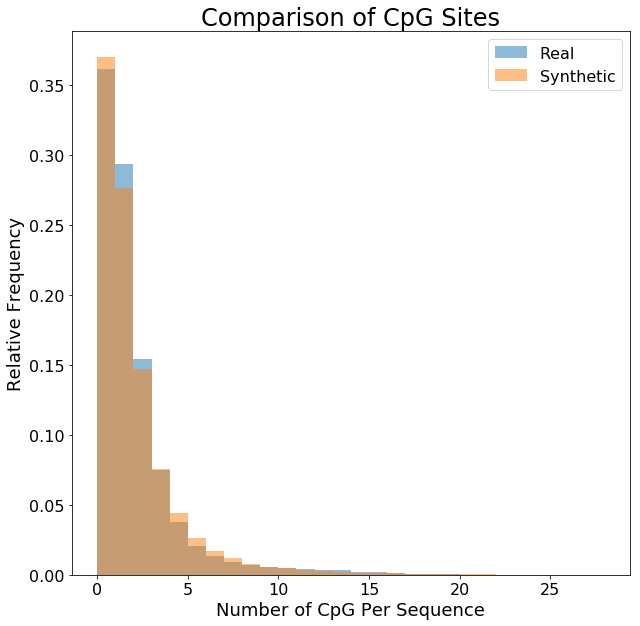

In [77]:
cpg = []
cpg1 = []
for i in range(len(real_seqs)):
    cpg.append(utils.count_cpg_sites([real_seqs[i]]))
for j in range(len(seqs)):
    cpg1.append(utils.count_cpg_sites([seqs[j]]))
plt.figure(figsize=(10, 10))
plt.hist(cpg, alpha=0.5, bins=int(max(cpg)), density=True, label="Real")
plt.hist(cpg1, alpha=0.5, bins=int(max(cpg1)), density=True, label="Synthetic")
plt.title("Comparison of CpG Sites", fontsize=24)
plt.xlabel("Number of CpG Per Sequence", fontsize=18)
plt.ylabel("Relative Frequency", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.savefig("/home/pbromley/generative_dhs/figures/nucleotides/cpg.pdf", format='pdf', bbox_inches='tight')

(array([  4.04411765e-03,   1.61764706e-02,   6.47058824e-02,
          7.27941176e-02,   0.00000000e+00,   1.73897059e-01,
          2.89154412e-01,   5.43933824e-01,   0.00000000e+00,
          8.53308824e-01,   1.27187500e+00,   2.00790441e+00,
          2.66102941e+00,   0.00000000e+00,   3.83786765e+00,
          4.67702206e+00,   6.06617647e+00,   0.00000000e+00,
          6.81029412e+00,   8.22371324e+00,   8.39558824e+00,
          0.00000000e+00,   8.61397059e+00,   8.49062500e+00,
          8.36930147e+00,   7.79503676e+00,   0.00000000e+00,
          7.05496324e+00,   6.69705882e+00,   6.04797794e+00,
          0.00000000e+00,   5.17647059e+00,   4.50514706e+00,
          3.71856618e+00,   3.41323529e+00,   0.00000000e+00,
          2.64283088e+00,   2.20000000e+00,   1.70661765e+00,
          0.00000000e+00,   1.56911765e+00,   1.22132353e+00,
          9.48345588e-01,   0.00000000e+00,   7.60294118e-01,
          6.47058824e-01,   4.50919118e-01,   3.70036765e-01,
        

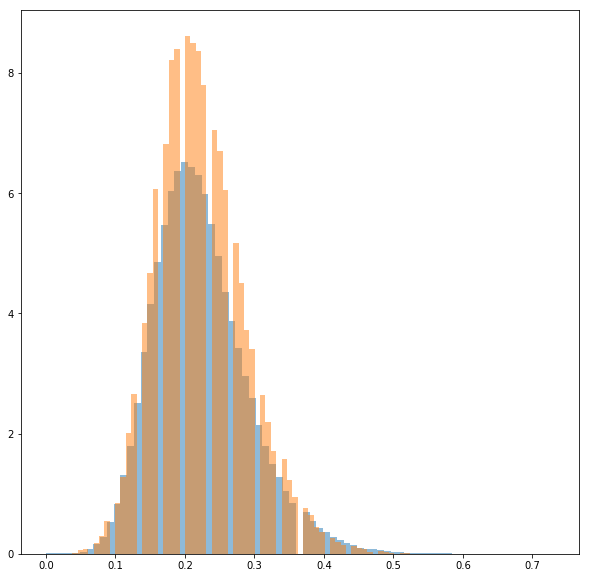

In [15]:
plt.figure(figsize=(10, 10))
plt.hist(all_stats_real[:, 3], bins=75, density=True, alpha=0.5)
plt.hist(all_stats_fake[:, 3], bins=66, density=True, alpha=0.5)

In [33]:
comp = 0
comp_seqs_oh = np.load("/home/pbromley/generative_dhs/optimized/nz100/seqs-{0}.npy".format(comp+1))
comp_seqs = [utils.one_hot_to_seq(o) for o in comp_seqs_oh]
real_comp_seqs = [utils.one_hot_to_seq(o) for o in real_one_hot[components == comp]]

In [34]:
utils.calc_overall_composition(real_comp_seqs)

array([ 26.82918261,  26.8940468 ,  23.17815695,  23.09861364])

In [35]:
utils.calc_overall_composition(comp_seqs)

array([ 21.669,  21.665,  27.84 ,  28.826])

In [36]:
comp_stats_fake = np.zeros((len(comp_seqs), 4))
comp_stats_real = np.zeros((len(real_comp_seqs), 4))
for i in range(len(comp_seqs)):
    comp_stats_fake[i] = utils.calc_overall_composition([comp_seqs[i]])/100
for i in range(len(real_comp_seqs)):
    comp_stats_real[i] = utils.calc_overall_composition([real_comp_seqs[i]])/100

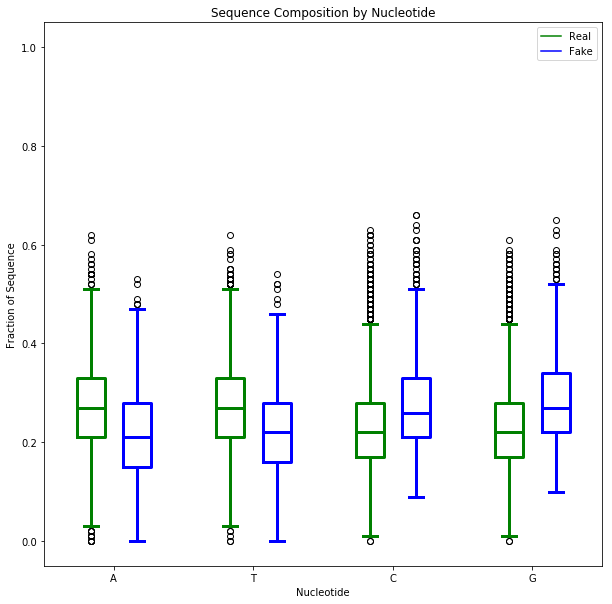

In [39]:
plt.figure(figsize=(10, 10))
bp = plt.boxplot([comp_stats_real[:, 0], comp_stats_fake[:, 0]], positions = [1, 2], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([comp_stats_real[:, 1], comp_stats_fake[:, 1]], positions = [4, 5], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([comp_stats_real[:, 2], comp_stats_fake[:, 2]], positions = [7, 8], widths = 0.6)
format_boxes(bp)
bp = plt.boxplot([comp_stats_real[:, 3], comp_stats_fake[:, 3]], positions = [10, 11], widths = 0.6)
format_boxes(bp)
plt.xlim(0, 12)
plt.xticks([1.5, 4.5, 7.5, 10.5], ["A", "T", "C", "G"])

hB, = plt.plot([1,1],'g-')
hR, = plt.plot([1,1],'b-')
plt.legend((hB, hR),('Real', 'Fake'))
hB.set_visible(False)
hR.set_visible(False)

plt.title("Sequence Composition by Nucleotide")
plt.xlabel("Nucleotide")
plt.ylabel("Fraction of Sequence")
plt.show()

(array([  5.76723442e-04,   2.30689377e-04,   3.46034065e-04,
          5.19051098e-04,   8.65085163e-04,   1.61482564e-03,
          3.17197893e-03,   3.40266831e-03,   5.59421739e-03,
          7.43973240e-03,   7.61274943e-03,   2.46260910e-02,
          1.41297243e-02,   1.70710139e-02,   1.93779076e-02,
          2.45107463e-02,   2.40493675e-02,   2.65292783e-02,
          3.09123765e-02,   3.09700488e-02,   3.41997001e-02,
          3.88134876e-02,   8.10873159e-02,   4.24468453e-02,
          4.37156369e-02,   4.31389135e-02,   4.28505517e-02,
          4.00822792e-02,   4.00822792e-02,   3.63912492e-02,
          3.37959937e-02,   2.94128955e-02,   2.75097082e-02,
          2.82594487e-02,   3.80060748e-02,   1.54561882e-02,
          1.33799839e-02,   1.20535199e-02,   9.40059210e-03,
          7.26671537e-03,   4.90214926e-03,   3.86404706e-03,
          2.59525549e-03,   1.90318736e-03,   1.44180860e-03,
          2.19154908e-03,   4.03706409e-04,   1.73017033e-04,
        

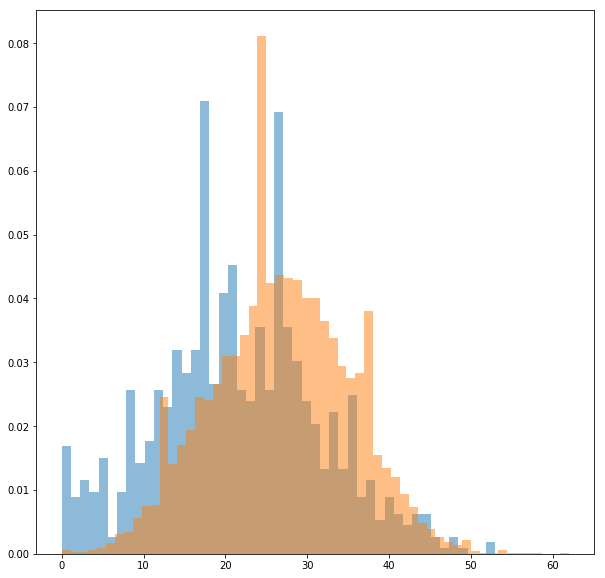

In [40]:
plt.figure(figsize=(10, 10))
plt.hist(comp_stats_fake[:, 0]*100, bins=47, density=True, alpha=0.5)
plt.hist(comp_stats_real[:, 0]*100, bins=57, density=True, alpha=0.5)

##### Explicit Motif Optimization

Find latent vectors that **G** maps to sequences with strong motif presences.  Slide a PWM one step at a time along one-hot sequence, compute inner product, take max.  Optimize by maximizing that value

In [13]:
irf4 = np.loadtxt("/home/pbromley/generative_dhs/memes/IRF4_IRF_1.txt")[:, np.array([0, 3, 1, 2])]
test = np.array([[0.0, 0.0, 0.0, 1.0],
                 [0.0, 0.0, 0.0, 1.0],
                 [0.4, 0.6, 0.0, 0.0],
                 [0.9, 0.1, 0.0, 0.0],
                 [0.0, 1.0, 0.0, 0.0],
                 [0.0, 0.8, 0.0, 0.2],
                 [0.5, 0.0, 0.0, 0.5],
                 [1.0, 0.0, 0.0, 0.0]])

In [6]:
class MotifMatch(nn.Module):
    def __init__(self, pwm):
        super(MotifMatch, self).__init__()
        self.motif_length = pwm.shape[0]
        kernel = pwm.reshape(1, 1, self.motif_length, 4)
#         kernel += np.random.normal(0, 1e-2, kernel.shape)
        self.kernel = nn.Parameter(data=torch.FloatTensor(kernel), requires_grad=False)

    def forward(self, x):
        conv = F.conv2d(x, self.kernel, padding=(self.motif_length-1, 0))
        l = conv.size(2)
        out = F.max_pool1d(conv.view(-1, 1, l), l)
        return out.squeeze()

In [15]:
l = MotifMatch(irf4)
l.to("cuda")
G.to("cuda")


snp_generator_2d_temp(
  (fc): Linear(in_features=100, out_features=1600, bias=True)
  (relu1): ReLU(inplace)
  (bn1): BatchNorm2d(160, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up1): ConvTranspose2d(160, 320, kernel_size=(10, 1), stride=(10, 10), bias=False)
  (relu2): ReLU(inplace)
  (bn2): BatchNorm2d(320, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up2): ConvTranspose2d(320, 1, kernel_size=(11, 4), stride=(1, 1), padding=(5, 0))
  (softmax): Softmax()
)

In [65]:
opt_z = torch.zeros(1, 100).normal_(0, 1).cuda().requires_grad_()
start = G(opt_z).cpu().detach().numpy()

tensor(8.4774, device='cuda:0')


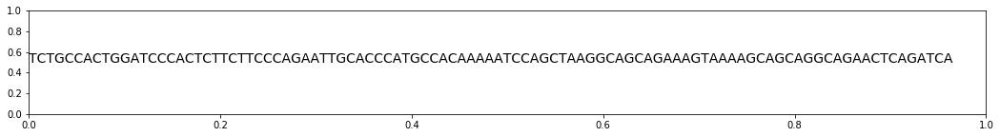

In [66]:
start_seq = utils.one_hot_to_seq(start.squeeze())
plt.figure(figsize=(18, 2))
plt.text(0, 0.5, start_seq, fontsize=14)
print(l(torch.FloatTensor(start).cuda()))

In [70]:
# worked: lr0.001, noise1e-3
optimizer = optim.Adam([opt_z], lr=0.01)
h = opt_z.register_hook(lambda grad: grad + torch.zeros_like(grad).normal_(0, 1e-5))
imgs = []
save = False
for i in range(500000):
    if save:
        imgs.append(opt_z[0].clone())
    G.zero_grad()
    l.zero_grad()
    optimizer.zero_grad()
    seq = G(opt_z)
    pred = l(seq)
    loss = -pred.squeeze() 
    loss.backward()
    optimizer.step()
    if i % 2000 == 0:
        print(pred.item())
        


8.477361679077148
8.58511734008789
8.58511734008789
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
8.80131721496582
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
9.798608779907227
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.612218856811523
10.61221885681

In [373]:
### Manually perform gradient descent
G.eval()
l.eval()
imgs = []
save = False
for i in range(500):
    if save:
        imgs.append(opt_z[0].clone())
    G.zero_grad()
    l.zero_grad()
    optimizer.zero_grad()
    seq = G(opt_z)
    pred = l(seq)
    print(pred)
    print(grad)
    loss = -pred.squeeze()
    loss.backward()
    with torch.no_grad():
        grad = opt_z.grad
        qn = torch.norm(grad, p=2, dim=1).detach()
        grad = grad.div(qn.expand_as(grad))
#         grad /= (grad**2).mean().sqrt() + 1e-5            # Normalize gradient
        opt_z -= 0.01 * grad
        opt_z.grad.zero_()

tensor(5.8736, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(5.8736, device='cuda:0')
tensor([[-0.0777, -0.0405,  0.0027,  0.0404,  0.0781, -0.1173,  0.1190,
         -0.0168, -0.0293,  0.0270, -0.0251,  0.0241, -0.2217,  0.0020,
         -0.0700, -0.0302,  0.0040, -0.0465,  0.2039,  0.1130,  0.2238,
          0

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan.,

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan.,

tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan.,

tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan.,

tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan.,

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.]], device='cuda:0')
tensor(6.9431, device='cuda:0')
tensor([[nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., nan., nan., nan.,
         nan., nan., nan., nan., nan., nan., nan., n

Text(0,0.5,'CCAGTCTCCTGGTTCCCCCCCTATGCTCCACAGGGGTGTTGAGCCGTCACAACCCAGCCGAACCCACCGAAACTGAAACTACACTCCATGGGGCCCCATT')

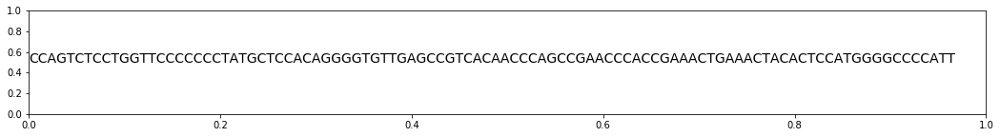

In [71]:
after = G(opt_z).cpu().detach().numpy()
after_seq = utils.one_hot_to_seq(after.squeeze())
plt.figure(figsize=(18, 2))
plt.text(0, 0.5, after_seq, fontsize=14)

In [23]:
#real_one_hot, real_components, _, _ = data_helper.load_the_data(filter_type='strong')
real_one_hot = real_one_hot_randomized

In [54]:
def plot_motif_statistics(real_one_hot, fake_one_hot, rand_one_hot):
    motif_idx = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/meme_set/motif_set_index.txt", dtype=str, delimiter='\t')
    motifs = [m[:-5] + ".txt" for m in motif_idx[1:, 3]]
    t_real = np.zeros((len(motifs), len(real_one_hot)))
    t_fake = np.zeros((len(motifs), len(fake_one_hot)))
    if rand_one_hot is not None:
        t_rand = np.zeros((len(motifs), len(rand_one_hot)))
    for i in range(len(motifs)):
        t_real[i] = utils.get_motif_scan_from_meme(x=real_one_hot, meme=motifs[i])
        print("   1")
        t_fake[i] = utils.get_motif_scan_from_meme(x=fake_one_hot, meme=motifs[i])
        print("   2")
        if rand_one_hot is not None:
            t_rand[i] = utils.get_motif_scan_from_meme(x=rand_one_hot, meme=motifs[i])
            print("   3")
        print(i)
    
    if rand_one_hot is not None:
        return t_real, t_fake, t_rand
    else:
        return t_real, t_fake
            

        
    

In [55]:
idx = np.random.choice([0, 1, 2, 3], (64000, 100), p=[0.2647729688, 0.2649203125, 0.235028125, 0.2352785937])
rand_one_hot = np.zeros((10000, 100, 4))
for i in range(len(rand_one_hot)):
    for j in range(100):
        rand_one_hot[i][j][idx[i][j]] = 1


In [56]:
# rand_one_hot = [utils.seq_to_one_hot(o) for o in rand_seqs]
# real_one_hot = [utils.seq_to_one_hot(o) for o in real_seqs_train]
treal, tfake, trand = plot_motif_statistics(real_one_hot, one_hot_seqs, rand_one_hot)

   1
   2
   3
0
   1
   2
   3
1
   1
   2
   3
2
   1
   2
   3
3
   1
   2
   3
4
   1
   2
   3
5
   1
   2
   3
6
   1
   2
   3
7
   1
   2
   3
8
   1
   2
   3
9
   1
   2
   3
10
   1
   2
   3
11
   1
   2
   3
12
   1
   2
   3
13
   1
   2
   3
14
   1
   2
   3
15
   1
   2
   3
16
   1
   2
   3
17
   1
   2
   3
18
   1
   2
   3
19
   1
   2
   3
20
   1
   2
   3
21
   1
   2
   3
22
   1
   2
   3
23
   1
   2
   3
24
   1
   2
   3
25
   1
   2
   3
26
   1
   2
   3
27
   1
   2
   3
28
   1
   2
   3
29
   1
   2
   3
30
   1
   2
   3
31
   1
   2
   3
32
   1
   2
   3
33
   1
   2
   3
34
   1
   2
   3
35
   1
   2
   3
36
   1
   2
   3
37
   1
   2
   3
38
   1
   2
   3
39
   1
   2
   3
40
   1
   2
   3
41
   1
   2
   3
42
   1
   2
   3
43
   1
   2
   3
44
   1
   2
   3
45
   1
   2
   3
46
   1
   2
   3
47
   1
   2
   3
48
   1
   2
   3
49
   1
   2
   3
50
   1
   2
   3
51
   1
   2
   3
52
   1
   2
   3
53
   1
   2
   3
54
   1
   2
   3
55
  

In [50]:
motifs

array(['V_P53_05.meme', 'V_RORA1_01.meme', 'V_PR_02.meme',
       'V_PAX5_01.meme', 'MA0068.1-Pax4.meme', 'V_HNF1_Q6_01.meme',
       'V_PAX4_04.meme', 'V_DEAF1_01.meme', 'V_COUPTF_Q6.meme',
       'V_HOX13_01.meme', 'CTCF_UpstreamP1.meme', 'V_MEF2_04.meme',
       'MEF2A_MADS_1.meme', 'V_STAF_01.meme', 'V_CTCF_01.meme',
       'V_OCT1_06.meme', 'Pou2f2.mouse_POU_2.meme', 'V_BCL6_Q3.meme',
       'V_MYOGNF1_01.meme', 'V_PAX1_B.meme', 'GRHL1_CP2_2.meme',
       'SPDEF_ETS_2.meme', 'V_HTF_01.meme', 'MA0080.1-SPI1.meme',
       'V_MIZF_01.meme', 'NFATC1_NFAT_2.meme', 'V_NFAT1_Q6.meme',
       'V_STAT1_03.meme', 'V_ZABC1_01.meme', 'V_LEF1_Q2.meme',
       'V_GATA4_Q3.meme', 'V_HOXA7_01.meme', 'V_NFY_Q6.meme',
       'V_TITF1_Q3.meme', 'MA0130.1-ZNF354C.meme', 'MA0100.1-Myb.meme',
       'TBX21_TBX_2.meme', 'SOX14_HMG_1.meme', 'MA0095.1-YY1.meme',
       'HOMEZ_HOMEZ_1.meme', 'CUX1_CUT_3.meme', 'V_MRF2_01.meme',
       'FOXK1_forkhead_1.meme', 'V_EVI1_06.meme',
       'MA0074.1-RXRA::VDR.me

Text(0.5,0.9,'Motif Distribution for Real, Synthetic and Randomized Seqs')

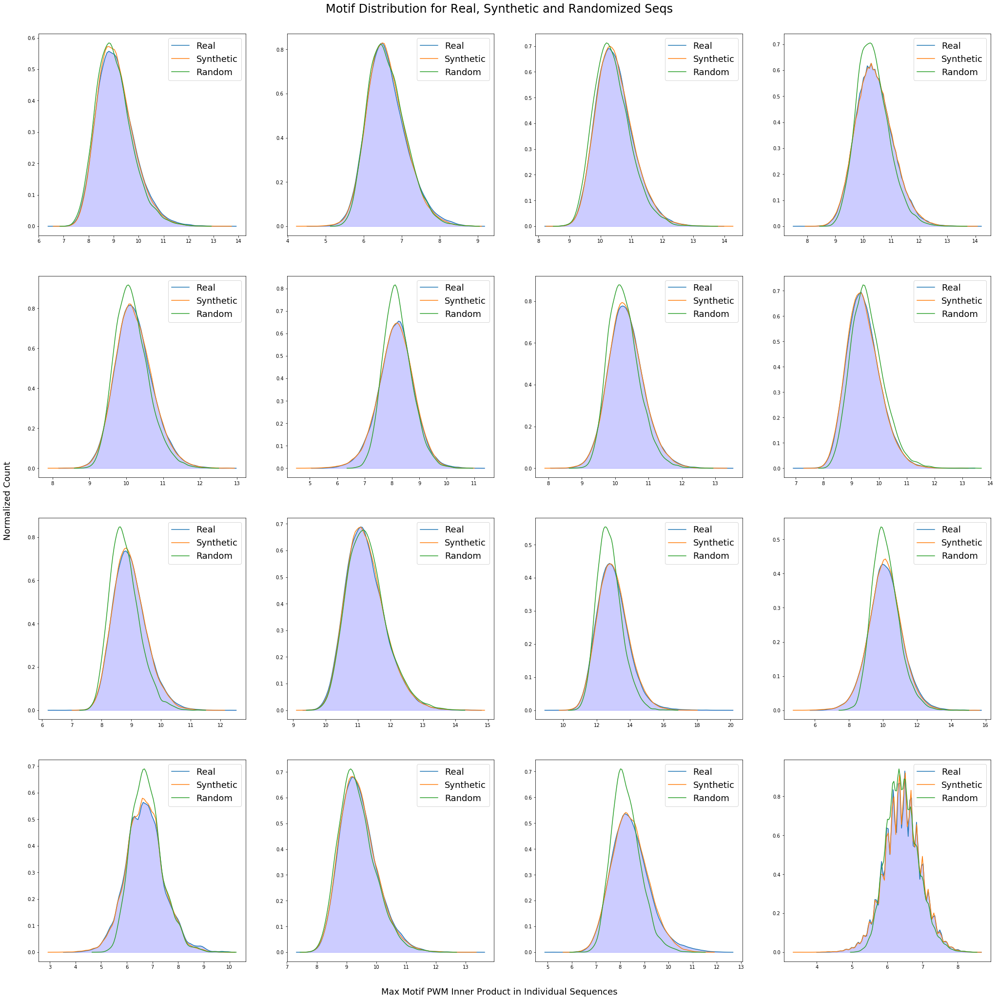

In [57]:
motifs = utils.get_motifs()
f, ax = plt.subplots(4, 4, figsize=(35, 35))
for w in range(4):
    for z in range(4):
        sns.distplot(treal[w*4+z], hist=False, ax=ax[w][z], label="Real")
        sns.distplot(tfake[w*4+z], hist=False, ax=ax[w][z], label="Synthetic")
        sns.distplot(trand[w*4+z], hist=False, ax=ax[w][z], label="Random")
        l1 = ax[w][z].lines[0] 
#         l2 = ax[w][z].lines[1]
        x1 = l1.get_xydata()[:,0]
        y1 = l1.get_xydata()[:,1]
#         x2 = l2.get_xydata()[:,0]
#         y2 = l2.get_xydata()[:,1]
        ax[w][z].fill_between(x1, y1, color='blue', alpha=0.2)
#         ax[w][z].fill_between(x2, y2, color='orange', alpha=0.2)
#         ax[w][z].set_title(motifs[w*4+z] + " (" + str(utils.get_order()[w*4+z]) + ")")
        ax[w][z].legend(fontsize=18)
f.text(0.5, 0.1, "Max Motif PWM Inner Product in Individual Sequences", ha="center", va="center", fontsize=18)
f.text(0.1, 0.5, "Normalized Count", ha="center", va="center", rotation="vertical", fontsize=18)
f.text(0.5, 0.9, "Motif Distribution for Real, Synthetic and Randomized Seqs", fontsize=24, ha="center", va="center")


In [59]:
kde_r, kde_f, kde_ra = [], [], []
for i in range(len(treal)):
    clip_low = max(treal[i].min(), tfake[i].min(), trand[i].min())
    clip_high = min(treal[i].max(), tfake[i].max(), trand[i].max())
    plt.figure()
    kde_r.append(sns.kdeplot(treal[i], clip=(clip_low, clip_high)).get_lines()[0].get_data())
    kde_f.append(sns.kdeplot(tfake[i], clip=(clip_low, clip_high)).get_lines()[1].get_data())
    kde_ra.append(sns.kdeplot(trand[i], clip=(clip_low, clip_high)).get_lines()[2].get_data())
    plt.close()

In [60]:
xs = np.array([x[0] for x in kde_r])
ys_r = np.array([x[1] for x in kde_r])
ys_f = np.array([x[1] for x in kde_f])
ys_ra = np.array([x[1] for x in kde_ra])

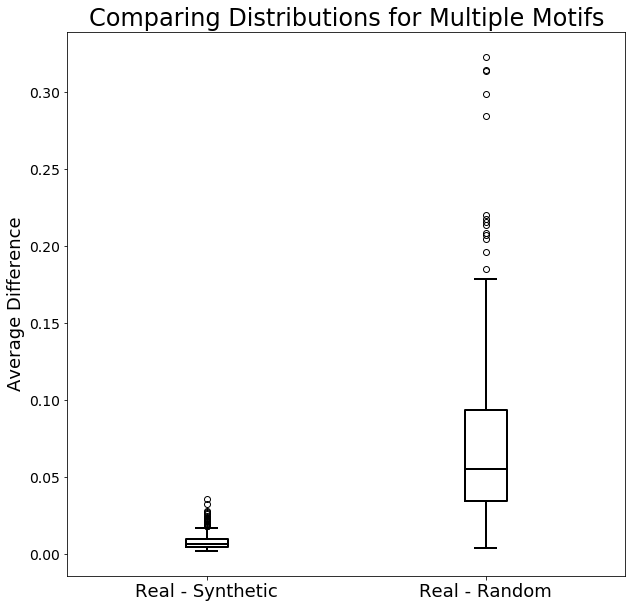

In [75]:
plt.figure(figsize=(10, 10))
plt.boxplot([np.abs(ys_r - ys_f).mean(1), np.abs(ys_r - ys_ra).mean(1)], 
             medianprops=dict(color='black', linewidth=2),
             capprops=dict(linewidth=2),
             whiskerprops=dict(linewidth=2),
             boxprops=dict(linewidth=2))
# plt.scatter([1, 2], [np.abs(ys_r - ys_f).mean(1)[2], np.abs(ys_r - ys_ra).mean(1)[2]], c="red", marker="x", s=100)
plt.xticks([1, 2], ["Real - Synthetic", "Real - Random"], fontsize=18)
plt.yticks(fontsize=14)
plt.title("Comparing Distributions for Multiple Motifs", fontsize=24)
plt.ylabel("Average Difference", fontsize=18)
plt.savefig("/home/pbromley/generative_dhs/figures/motif_dists/density_compare.pdf", format='pdf', bbox_inches='tight')

In [38]:
np.abs(ys_r - ys_ra).mean(1)

array([ 0.04579368,  0.02692584,  0.03515792,  0.03246008,  0.04700241,
        0.03925815,  0.04126329,  0.02163583,  0.01279384,  0.03721413,
        0.03721413,  0.03200583,  0.00601244,  0.04805676,  0.03964873,
        0.03794496])

In [200]:
sns.color_palette(utils.get_dhs_colors())

[(0.76470588235294112, 0.76470588235294112, 0.76470588235294112),
 (0.73333333333333328, 0.17647058823529413, 0.83137254901960789),
 (0.019607843137254902, 0.75686274509803919, 0.85098039215686272),
 (0.47843137254901963, 0.0, 1.0),
 (0.99607843137254903, 0.50588235294117645, 0.0078431372549019607),
 (0.29019607843137257, 0.40784313725490196, 0.46274509803921571),
 (1.0, 0.89803921568627454, 0.0),
 (0.015686274509803921, 0.40392156862745099, 0.99215686274509807),
 (0.027450980392156862, 0.68627450980392157, 0.0),
 (0.41176470588235292, 0.12941176470588237, 0.031372549019607843),
 (0.72549019607843135, 0.27450980392156865, 0.11372549019607843),
 (0.29803921568627451, 0.49019607843137253, 0.078431372549019607),
 (0.0, 0.58431372549019611, 0.53333333333333333),
 (0.25490196078431371, 0.27450980392156865, 0.074509803921568626),
 (1.0, 0.0, 0.0),
 (0.031372549019607843, 0.14117647058823529, 0.35686274509803922)]

##### Binary Classifier Maximization

In [104]:
import classifiers

In [206]:
model = classifiers.hot_dog_not_hot_dog()
model.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/hot_dog_3.pth"))
model.to("cuda")

hot_dog_not_hot_dog(
  (conv1): Conv2d(1, 320, kernel_size=(17, 4), stride=(1, 1), padding=(8, 0))
  (pool1): MaxPool2d(kernel_size=(20, 1), stride=(20, 1), padding=0, dilation=1, ceil_mode=False)
  (lrelu1): LeakyReLU(negative_slope=0.1, inplace)
  (drop1): Dropout(p=0.5)
  (fc1): Linear(in_features=1600, out_features=1, bias=True)
  (sig): Sigmoid()
)

In [230]:
opt_z = torch.zeros(1, 100).normal_(0, 1).cuda().requires_grad_()
start = G(opt_z).cpu().detach().numpy()

tensor(0.2641, device='cuda:0')


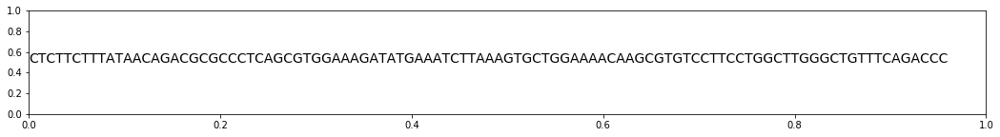

In [231]:
start_seq = utils.one_hot_to_seq(start.squeeze())
plt.figure(figsize=(18, 2))
plt.text(0, 0.5, start_seq, fontsize=14)
print(model(torch.FloatTensor(start).cuda()))

In [232]:
# worked: lr0.001, noise1e-3
optimizer = optim.Adam([opt_z], lr=0.01)
m1 = nn.Sequential(*list(model.children())[:-2])
m2 = nn.Sequential(*list(model.children())[-2:-1])
h = opt_z.register_hook(lambda grad: grad + torch.zeros_like(grad).normal_(0, 1e-5))
imgs = []
save = False
m1.eval()
m2.eval()
G.eval()
for i in range(500000):
    if save:
        imgs.append(opt_z[0].clone())
    G.zero_grad()
    m1.zero_grad()
    m2.zero_grad()
    optimizer.zero_grad()
    seq = G(opt_z)
    tmp = m1(seq)
    pred = m2(tmp.view(-1, 1600))
    loss = -pred.squeeze() 
    loss.backward()
    optimizer.step()
    if i % 2000 == 0:
        print(pred.item())
        print(utils.one_hot_to_seq(seq.squeeze().detach().cpu().numpy()))
        



-1.0249611139297485
CTCTTCTTTATAACAGACGCGCCCTCAGCGTGGAAAGATATGAAATCTTAAAGTGCTGGAAAACAAGCGTGTCCTTCCTGGCTTGGGCTGTTTCAGACCC
-1.0524846315383911
CTCTTCTTTATAACAGACGCGCCCTCAGCGTGGAAAGATATGAAATCTTAAAGTGGTGGAAAACAAGCGGGTCCTTCCTGGCTTGGGCTGTTTCACACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTGTCAGGCGCGCCCTCAGCGCACACAGGCAGGGAATCCTAAGCTGGCCGGGAGCAGGAGGGTCCTTCCTGGCCTGGGCTGCTTCCCACCC
-1.4581239223480225
CTCTCCTTTCTG

3.516770124435425
CTCTCCTTTCAGTCATCCTTGTGCTGTGGTCTGACTGGCTGTGACTCATAACCACTCATTCCTCTGGAGTTTGCTTTCTTGCTCTGTTAGGTTCCCACAC
3.516770124435425
CTCTCCTTTCAGTCATCCTTGTGCTGTGGTCTGACTGGCTGTGACTCATAACCACTCATTCCTCTGGAGTTTGCTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTTCTGTGGTCTGACTGGCTCTGACTCATAACCACTCATCCCTCTGGAGTTTGGTTTCTTGCTCTGTTAGGTTCCCACAC
4.2259674072265625
CACTGATTTCAGTCATCCTTTTT

6.47846794128418
CACTGTGGTTAGTCATCCTTTTTCTGTGGTCTGACTCGCTGCGACTCATAATGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.47846794128418
CACTGTGGTTAGTCATCCTTTTTCTGTGGTCTGACTCGCTGCGACTCATAATGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.47846794128418
CACTGTGGTTAGTCATCCTTTTTCTGTGGTCTGACTCGCTGCGACTCATAATGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.903697490692139
CACTGTGGTTAGTCATCCCTTTTCTGTGGTCTGACTCGCTGCGACTCATGGTGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.903697490692139
CACTGTGGTTAGTCATCCCTTTTCTGTGGTCTGACTCGCTGCGACTCATGGTGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.903697490692139
CACTGTGGTTAGTCATCCCTTTTCTGTGGTCTGACTCGCTGCGACTCATGGTGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.903697490692139
CACTGTGGTTAGTCATCCCTTTTCTGTGGTCTGACTCGCTGCGACTCATGGTGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
6.903697490692139
CACTGTGGTTAGTCATCCCTTTTCTGTGGTCTGACTCGCTGCGACTCATGGTGACTCATCCCTCTGGATTTTGGTTTCTGGCTCTGTCTGGTGCCCAGAC
7.354654788970947
CACTGTGGTTAGTCATCCCATTTCTGTGGTCTG

KeyboardInterrupt: 

In [472]:
def sample_gumbel(shape, eps=1e-20):
    U = torch.rand(shape).cuda()
    return -torch.log(-torch.log(U + eps) + eps)

def gumbel_softmax_sample(logits, temperature):
    y = logits + sample_gumbel(logits.size())
    return F.softmax(y / temperature, dim=-1)

def gumbel_softmax(logits, temperature):
    """
    input: [*, n_class]
    return: [*, n_class] an one-hot vector
    """
    y = gumbel_softmax_sample(logits, temperature)
    shape = y.size()
    _, ind = y.max(dim=-1)
    y_hard = torch.zeros_like(y).view(-1, shape[-1])
    y_hard.scatter_(1, ind.view(-1, 1), 1)
    y_hard = y_hard.view(*shape)
    return (y_hard - y).detach() + y

In [482]:
gumbel_softmax(torch.FloatTensor(np.array([[[5, -2, 3, 1], 
                                              [1, 5, -3, 2]]])).cuda(), 0.1)

tensor([[[ 1.,  0.,  0.,  0.],
         [ 0.,  1.,  0.,  0.]]], device='cuda:0')

In [470]:
x = nn.Softmax(dim=2)

In [471]:
x(torch.FloatTensor(np.array([[[5, 2, 3, 1], 
                            [1, 5, 3, 2]]])))

tensor([[[ 0.8310,  0.0414,  0.1125,  0.0152],
         [ 0.0152,  0.8310,  0.1125,  0.0414]]])

In [78]:
x = torch.LongTensor([1, 2, 3, 4, 5, 6])

In [79]:
x

In [80]:
x

tensor([ 0,  1,  0,  0,  0,  0])

In [100]:
alx3 = np.loadtxt("/home/pbromley/generative_dhs/memes/ALX3_homeodomain_1.txt")[:, np.array([0, 3, 1, 2])]

In [101]:
l = MotifMatch(alx3)

In [94]:
_, _, test_one_hot, _ = data_helper.load_the_data()

In [102]:
t = np.zeros(len(test_one_hot))
for i in range(len(test_one_hot)):
    t[i] = l(torch.FloatTensor(test_one_hot[i].reshape(1, 1, 100, 4))).item()

(array([  5.08066480e-05,   5.08066480e-05,   5.08066480e-05,
          5.08066480e-05,   5.08066480e-05,   1.01613296e-04,
          1.52419944e-04,   2.03226592e-04,   3.55646536e-04,
          4.57259832e-04,   5.08066480e-04,   1.27016620e-03,
          8.12906368e-04,   1.72742603e-03,   2.43871910e-03,
          2.64194569e-03,   4.11533849e-03,   4.36937173e-03,
          6.55405759e-03,   1.02121362e-02,   1.35653750e-02,
          1.44290880e-02,   1.86968465e-02,   2.09831456e-02,
          2.64194569e-02,   3.26686746e-02,   4.31348441e-02,
          5.81228053e-02,   6.45752496e-02,   6.58962224e-02,
          8.70825946e-02,   1.10860106e-01,   1.52216717e-01,
          1.68271618e-01,   1.82853126e-01,   1.88695891e-01,
          2.18163746e-01,   2.66988935e-01,   2.91274513e-01,
          3.30649665e-01,   3.34053710e-01,   3.65909479e-01,
          4.20170979e-01,   4.63204210e-01,   5.42259354e-01,
          5.80719986e-01,   6.06428150e-01,   6.70342913e-01,
        

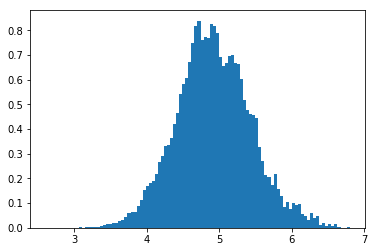

In [103]:
plt.hist(t, bins=100, density=True)

In [105]:
z1 = np.random.normal(0, 1, 100)
z2 = np.random.normal(0, 1, 100)
x1 = G(torch.FloatTensor(z1).cuda())
x2 = G(torch.FloatTensor(z2).cuda())

<Figure size 1296x720 with 0 Axes>

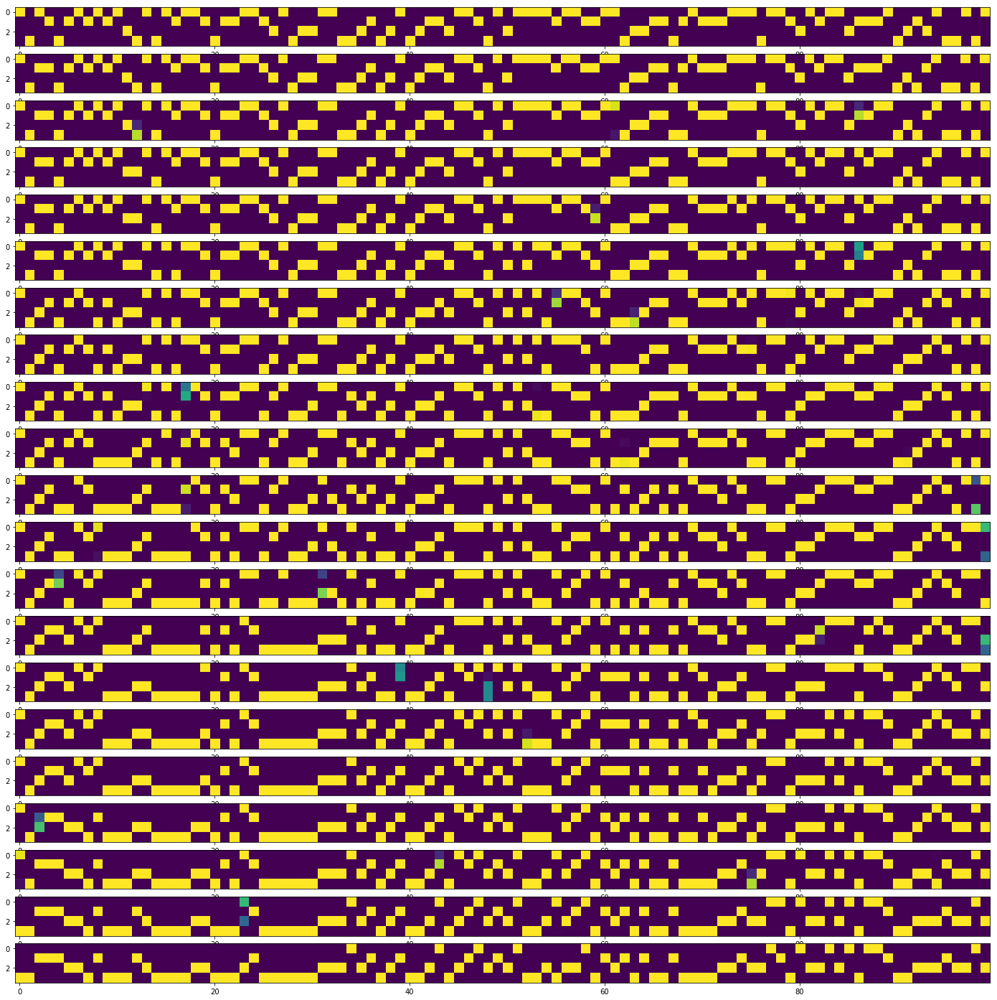

In [125]:
plt.figure(figsize=(18, 10))
# plt.text(0.01, 0.1, utils.one_hot_to_seq(x1.detach().cpu().numpy().reshape(100, 4)), fontsize=14)
dz = z2 - z1
f, ax = plt.subplots(21, 1, figsize=(25, 25))
for i in range(21):
    z = z1 + (0.05 * i * dz)
    x = G(torch.FloatTensor(z).cuda()).detach().cpu().numpy().squeeze()
#     plt.text(0.01, i*0.05, utils.one_hot_to_seq(x), fontsize=14)
    ax[i].imshow(x.transpose())


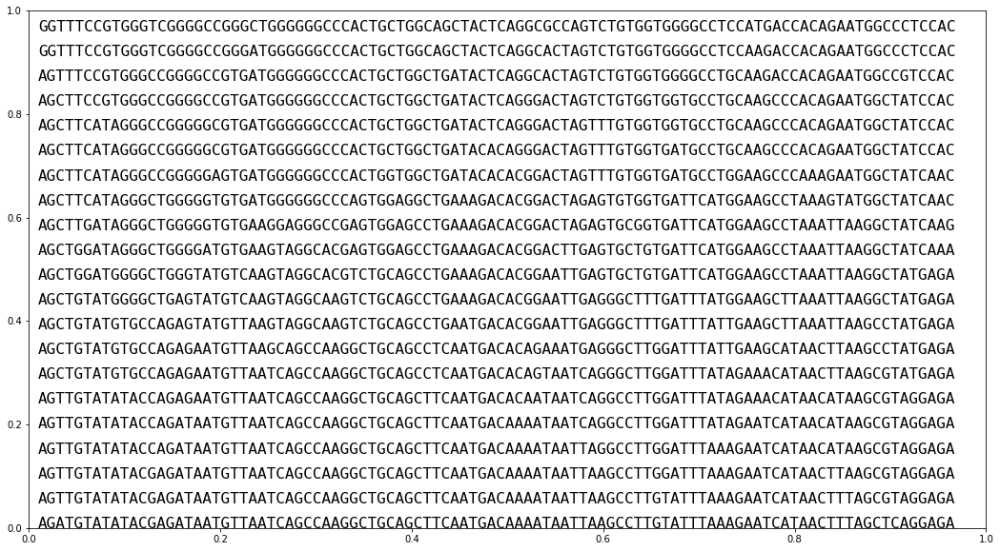

In [131]:
from matplotlib.font_manager import FontProperties
font = FontProperties()
font.set_family('monospace')
font.set_size(16)
plt.figure(figsize=(18, 10))
# plt.text(0.01, 0.1, utils.one_hot_to_seq(x1.detach().cpu().numpy().reshape(100, 4)), fontsize=14)
dz = z2 - z1
for i in range(21):
    z = z1 + (0.05 * i * dz)
    x = G(torch.FloatTensor(z).cuda()).detach().cpu().numpy().squeeze()
    plt.text(0.01, i*0.048, utils.one_hot_to_seq(x), fontproperties=font)

In [14]:
x_train, y_train, x_test, y_test = data_helper.load_the_data()

In [15]:
real_seqs_train = [utils.one_hot_to_seq(o) for o in x_train]
real_seqs_test = [utils.one_hot_to_seq(o) for o in x_test]

In [69]:
real_seqs_test = real_seqs_test[0:1536]

[Seq('TCTCCAGGCTGCTTACATCCTTATGAAAAGCCTCCGCCATTCCCTGCAAACTCT...GGA', SingleLetterAlphabet()),
 Seq('AGAAAACACAGCAAAGAGGTGTTGGACGGAATAACTGATGTGGCTCATAGCCAG...CAT', SingleLetterAlphabet()),
 Seq('AAGGCAAGCTGGGACCCCAGCGGCCTTCTCTTCTAAGAATGAGGGTACACAGGT...TAG', SingleLetterAlphabet()),
 Seq('AAACTGACAGTTATTACCTCTGAGTCATCAAACTCTCTCTAGCGGTCAACTCCC...GCT', SingleLetterAlphabet()),
 Seq('CTCTGCTAATGTACATGGCTCTGTGACCACCTCCTTCTTGTATCTGAAAGCCAT...GGA', SingleLetterAlphabet()),
 Seq('TGTTGAGCAGGTGCCAAGATTTTTCTGACTTGCCCCATTTTGCCAACTCTTTAC...CAT', SingleLetterAlphabet()),
 Seq('TTGGAATGAGCAGCTCTTATTGAGTCATCAGAGTTGATATGCGCCAGGAGCTAG...TCT', SingleLetterAlphabet()),
 Seq('AACCTCACAGTTCTCCTCAGGTTTATGCTGCAGGAATGTAGAAGTTGTGGGGGG...TCA', SingleLetterAlphabet()),
 Seq('TAGGGAGCTGTGACTCAAACCAGGTTTACCATTGTGCAGGGAAGCTGGAACAAC...CAC', SingleLetterAlphabet()),
 Seq('CCAAAGGCCCGTGAGGGCTGCCGAAGCCCCGCAAACGCTCTCACCCTGCTACAG...CTC', SingleLetterAlphabet()),
 Seq('GCCTGGGAGAACCTGAAAAGACCAGATGAAGACAGTCTTTTGAGCATCATGTAC

In [76]:
one_hot, real_components, _, _ = data_helper.load_the_data('strong')
real_s = [utils.one_hot_to_seq(o) for o in one_hot]

In [77]:
seq_array = []
for i in range(len(real_s)):
    seq_array.append(SeqRecord(real_s[i], id=str(real_components[i])))
SeqIO.write(seq_array, "/home/pbromley/generative_dhs/memes/new_memes/strong0.fasta", "fasta")

256000

In [51]:
rand_seqs = [Seq(s) for s in rand_seqs]

In [34]:
tmp = np.array([1, 2, 0, 3, 5, 2])
np.bincount((tmp == 2).astype(int))

array([4, 2])

In [7]:
dl = data_helper.get_the_dataloader(batch_size=128, binary_class=6, weighted_sample=True)

In [9]:
for batch in dl:
    _, c = batch
    break

In [19]:
np.array([[[1], [2], [3], [4], [5]]])[:, np.random.permutation(3), :]

array([[[3],
        [1],
        [2]]])

In [24]:
torch.LongTensor([1, 0, 0, 1]) >= 0.5

tensor([ 1,  1,  1,  1], dtype=torch.uint8)

In [35]:
import pandas as pd

In [98]:
sim_scores1 = pd.read_csv("/home/pbromley/generative_dhs/memes/train_test_out.txt", delimiter="\t", header=None)
sim_scores2 = pd.read_csv("/home/pbromley/generative_dhs/memes/fake_query_out.txt", delimiter="\t", header=None)
sim_scores3 = pd.read_csv("/home/pbromley/generative_dhs/memes/self.txt", delimiter="\t", header=None)
sim_scores4 = pd.read_csv("/home/pbromley/generative_dhs/memes/self_test.txt", delimiter="\t", header=None)

In [99]:
sim_scores3 = sim_scores3[sim_scores3[7] != 200]
sim_scores4 = sim_scores4[sim_scores4[7] <= 60]

(array([  6.93370000e+04,   0.00000000e+00,   3.13280000e+04,
          0.00000000e+00,   1.05590000e+04,   0.00000000e+00,
          3.48800000e+03,   0.00000000e+00,   1.18600000e+03,
          0.00000000e+00,   4.64000000e+02,   0.00000000e+00,
          1.40000000e+02,   0.00000000e+00,   4.70000000e+01,
          0.00000000e+00,   2.10000000e+01,   0.00000000e+00,
          8.00000000e+00,   4.00000000e+00]),
 array([ 26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,  35.,  36.,
         37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,  46.]),
 <a list of 20 Patch objects>)

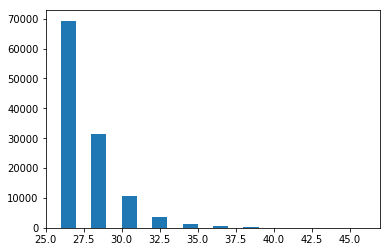

In [101]:
plt.hist(sim_scores3[7].tolist(), bins=20)
# plt.hist(sim_scores2[7].tolist(), density=True, bins=20)

In [79]:
print(real_seqs_train[1198610])
print(y_train[1198610])
print(real_seqs_test[8])
print(y_test[8])

AGGTTTAGTCAGTCTAATCAGTTTTTGAGCTTGGCTTGTGTTTTGTTATTGCCATGGTAACCTTCATTCCAGCAATAACTTCCCATTCCACTGGCATTTC
3.0
TTAGTCAGTCTAATCAGTTTTTGAGCTTGGTTTGTGTTTTGTTATTGCCATGGTAACCTTCATTCCAGCAATAACTTCACATTCCACTAGCATTTCACTG
4.0


In [103]:
print(real_seqs_test[58])
print(real_seqs_test[181])

AGTATGATGGTGGGCTTCTGTAATCCCAGGTATTCAGGAGGCTGAGGTATGAGAATCACTTGAACTTGGGAGGCGGAGGTTGCAGTGAGCCGTCATCGCA
TGCCTGTAATCCTAGCTACTCAGGAGGCTGAGGCGAGGGAATCACTTGAGCCTGGAAGGCGGAGGTTGAGTGAGCTGACATCGTGCCACTGCACTCTAGC


In [233]:
# A Dynamic Programming based Python program for edit
# distance problem
def editDistDP(str1, str2, m, n):
    # Create a table to store results of subproblems
    dp = [[0 for x in range(n+1)] for x in range(m+1)]
 
    # Fill d[][] in bottom up manner
    for i in range(m+1):
        for j in range(n+1):
 
            # If first string is empty, only option is to
            # isnert all characters of second string
            if i == 0:
                dp[i][j] = j    # Min. operations = j
 
            # If second string is empty, only option is to
            # remove all characters of second string
            elif j == 0:
                dp[i][j] = i    # Min. operations = i
 
            # If last characters are same, ignore last char
            # and recur for remaining string
            elif str1[i-1] == str2[j-1]:
                dp[i][j] = dp[i-1][j-1]
 
            # If last character are different, consider all
            # possibilities and find minimum
            else:
                dp[i][j] = 1 + min(dp[i][j-1],        # Insert
                                   dp[i-1][j],        # Remove
                                   dp[i-1][j-1])    # Replace
 
    return dp[m][n]

In [242]:
import Levenshtein

In [310]:
dist1 = np.zeros(1000*1000)
dist2 = np.zeros(1000*1000)
dist3 = np.zeros(1000*1000)
for i in range(1000):
    for j in range(1000):
        dist1[i*1000+j] = (Levenshtein.distance(str(real_seqs_train[np.random.randint(len(real_seqs_train))]), str(real_seqs_train[np.random.randint(len(real_seqs_train))])))
        dist2[i*1000+j] = (Levenshtein.distance(str(seqs[np.random.randint(len(seqs))]), str(real_seqs_train[np.random.randint(len(real_seqs_train))])))
        dist3[i*1000+j] = (Levenshtein.distance(str(rand_seqs[np.random.randint(len(rand_seqs))]), str(real_seqs_train[np.random.randint(len(real_seqs_train))])))
    if i % 100 == 0:
        print(i)

0
100
200
300
400
500
600
700
800
900


(array([  3.00000000e+00,   7.00000000e+00,   3.60000000e+01,
          1.06000000e+02,   3.64000000e+02,   9.84000000e+02,
          2.39200000e+03,   5.57700000e+03,   1.19050000e+04,
          2.31550000e+04,   4.01290000e+04,   6.38660000e+04,
          9.10240000e+04,   1.16453000e+05,   1.32617000e+05,
          1.34179000e+05,   1.21046000e+05,   9.64440000e+04,
          6.80990000e+04,   4.37810000e+04,   2.44360000e+04,
          1.28390000e+04,   5.99600000e+03,   2.64600000e+03,
          1.11000000e+03,   4.84000000e+02,   1.77000000e+02,
          8.50000000e+01,   3.40000000e+01,   1.40000000e+01,
          5.00000000e+00,   6.00000000e+00,   1.00000000e+00]),
 array([ 42.,  43.,  44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,
         53.,  54.,  55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,
         64.,  65.,  66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,
         75.]),
 <a list of 33 Patch objects>)

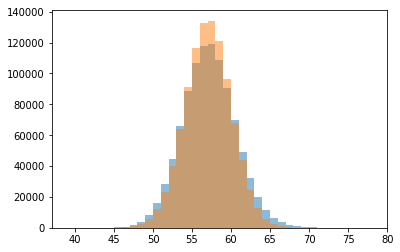

In [315]:
plt.hist(dist2, bins=39, alpha=0.5)
plt.hist(dist3, bins=33, alpha=0.5)
# plt.xlim(70, 90)
# plt.ylim(0, 30)

In [44]:
def create_random_sequences(num_seqs):
    d = {0:"A", 1:"T", 2:"C", 3:"G"}
    seqs = []
    for i in range(num_seqs):
        seq = ""
        for j in range(100):
            seq += d[np.random.randint(4)]
        seqs.append(seq)
    return seqs

In [45]:
rand_seqs = create_random_sequences(1870000)

In [6]:
import pandas as pd

In [7]:
# meme = pd.read_csv("/home/pbromley/generative_dhs/memes/out.txt", delimiter="\t", header=None)
meme1 = pd.read_csv("/home/pbromley/generative_dhs/memes/out.txt", delimiter="\t", header=None)
# meme2 = pd.read_csv("/home/pbromley/generative_dhs/memes/out.txt", delimiter="\t", header=None)

In [9]:
meme1

,0,1,2,3,4,5,6,7,8,9
0,ALX3_homeodomain_1,NaN,1741174,1,10,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
1,ALX3_homeodomain_1,NaN,55229,1,10,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
2,ALX3_homeodomain_1,NaN,316490,1,10,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
3,ALX3_homeodomain_1,NaN,922366,1,10,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
4,ALX3_homeodomain_1,NaN,392140,1,10,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
5,ALX3_homeodomain_1,NaN,838180,5,14,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
6,ALX3_homeodomain_1,NaN,1658938,5,14,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
7,ALX3_homeodomain_1,NaN,1513261,6,15,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
8,ALX3_homeodomain_1,NaN,1794908,7,16,+,13.3900,9.540000e-07,0.892,GCTAATTAGC
9,ALX3_homeodomain_1,NaN,1499051,7,16,+,13.3900,9.540000e-07,0.892,GCTAATTAGC


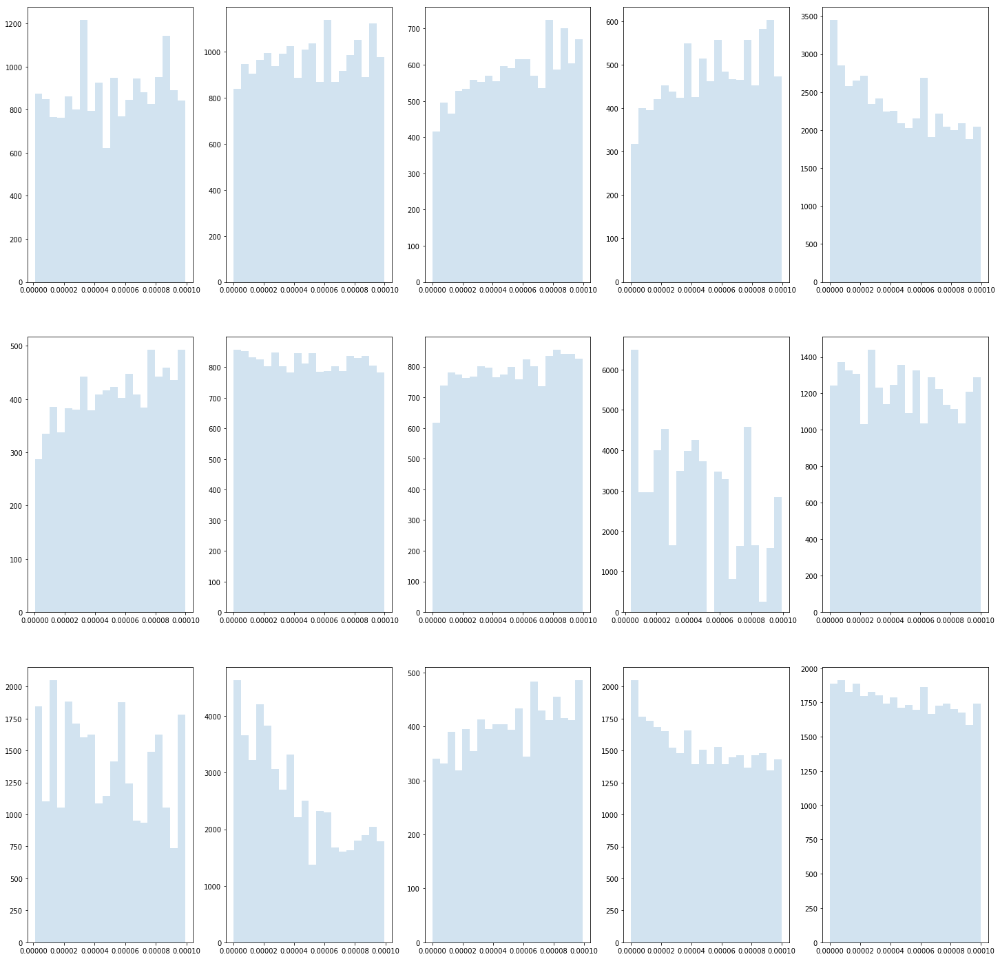

In [10]:
motifs = ["ALX3_homeodomain_1", "ATF4_bZIP_1", "CTCF_C2H2_1", "ERG_ETS_4", "FOXC2_forkhead_3",
              "GRHL1_CP2_1", "HNF4A_nuclearreceptor_5", "IRF4_IRF_1", "JDP2_bZIP_1", "MEF2A_MADS_1",
              "MYF6_bHLH_1", "NFE2_bZIP_1", "PAX2_PAX_1", "SPI1_ETS_1", "V_POU5F1_04"]
f, ax = plt.subplots(3, 5, figsize=(25, 25))
for w in range(3):
    for z in range(5):
#         ax[w][z].hist(meme[meme[0] == motifs[w*5+z]][7].tolist(), bins=20, alpha=0.2)
        ax[w][z].hist(meme1[meme1[0] == motifs[w*5+z]][7].tolist(), bins=20, alpha=0.2)
#         ax[w][z].hist(meme2[meme2[0] == motifs[w*5+z]][7].tolist(), bins=20, alpha=0.2)

In [7]:
importlib.reload(data_helper)
x_train, y_train, x_test, y_test = data_helper.load_the_data('strong')

In [8]:
x_train_seqs = [utils.one_hot_to_seq(s) for s in x_train]
x_test_seqs = [utils.one_hot_to_seq(s) for s in x_test]

In [9]:
x_train_seqs[0]

Seq('AAGGAAGGAATCTACGAAGGCTAAAAACGGAAACAGAAACCCTGCTGTGACTCC...ACC', SingleLetterAlphabet())

In [10]:
real_one_hot = x_train
real_components = y_train

In [11]:
def motif_tsne_mat(one_hot_seqs, components):
    motifs = ["MA0102.1-Cebpa.txt", "IRF4_IRF_1.txt", "SPI1_ETS_1.txt", "V_MEF2_02.txt", 
              "Ascl2.mouse_bHLH_1.txt", "ERG_ETS_2.txt", "V_OCT4_01.txt", "ISX_homeodomain_1.txt",
              "HNF4A_nuclearreceptor_3.txt", "RUNX3_RUNX_4.txt", "RUNX3_RUNX_4.txt", "V_DBX1_01.txt",
              "TP63_p53l_1.txt", "Foxl1_primary.txt", "HOXD12_homeodomain_3.txt", "V_NRF1_Q6.txt"]
    mat = np.zeros((len(one_hot_seqs), len(motifs)))
    one_hot_seqs = one_hot_seqs.reshape(-1, 1, 100, 4)
    for i in range(len(motifs)):
        m = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/" + motifs[i])[:, np.array([0, 3, 1, 2])]
        l = MotifMatch(m)
        for j in range(len(one_hot_seqs)):
            mat[j][i] = l(torch.FloatTensor(one_hot_seqs[j].reshape(1, 1, 100, 4))).item()
        print(i)
    
    return mat

In [12]:
mat = motif_tsne_mat(real_one_hot, real_components)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


In [64]:
from sklearn.manifold import TSNE

In [65]:
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200.0, n_iter=1000, verbose=2)

x_emb = tsne.fit_transform(mat[idx])

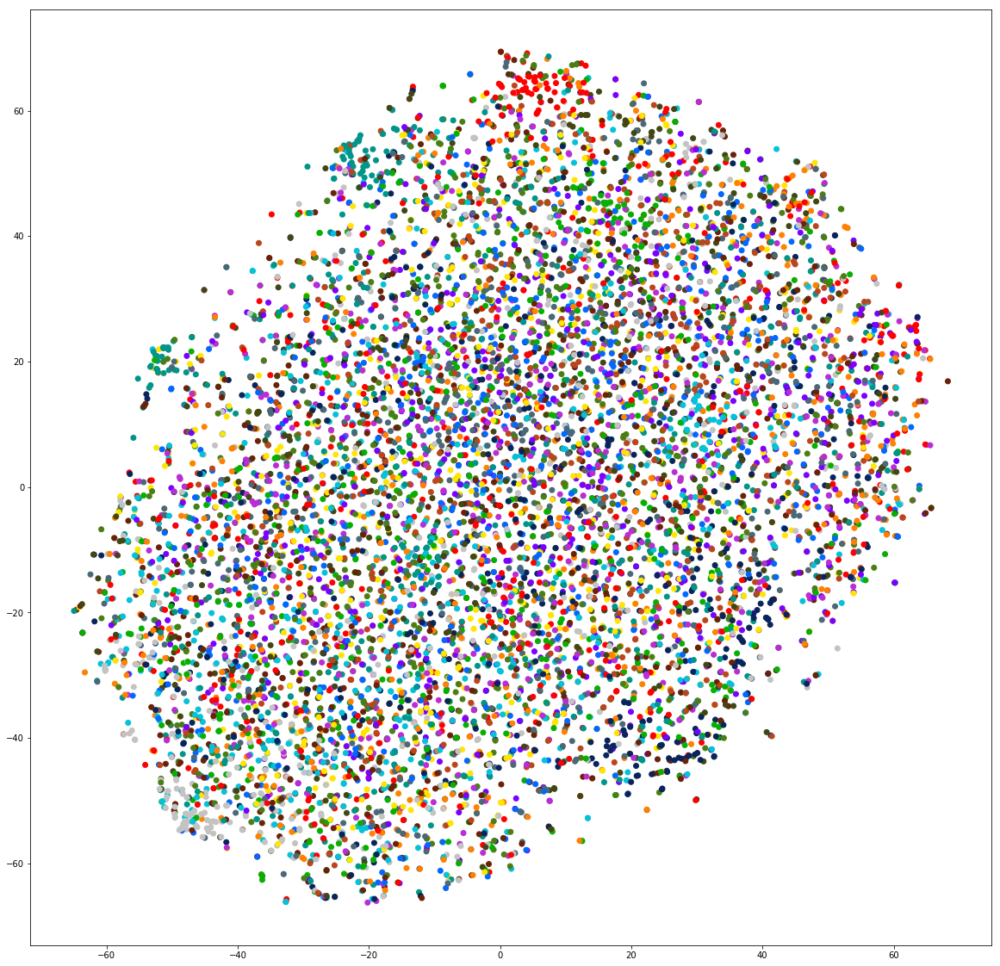

In [68]:
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(utils.get_dhs_colors()/255)
plt.figure(figsize=(20, 20))
plt.scatter(x_emb[:, 0], x_emb[:, 1], c=real_components[idx], cmap=cmap)

In [58]:
utils.get_dhs_colors().shape

(16, 3)

In [25]:
mat[:, 0][real_components == 0]

array([ 5.11111212,  5.27777719,  5.66666746, ...,  4.94444466,
        4.66666603,  4.55555534])

In [21]:
import umap

In [22]:
reducer = umap.UMAP()

In [23]:
idx = np.random.permutation(len(mat))[:100000]
embedding = reducer.fit_transform(mat[idx])

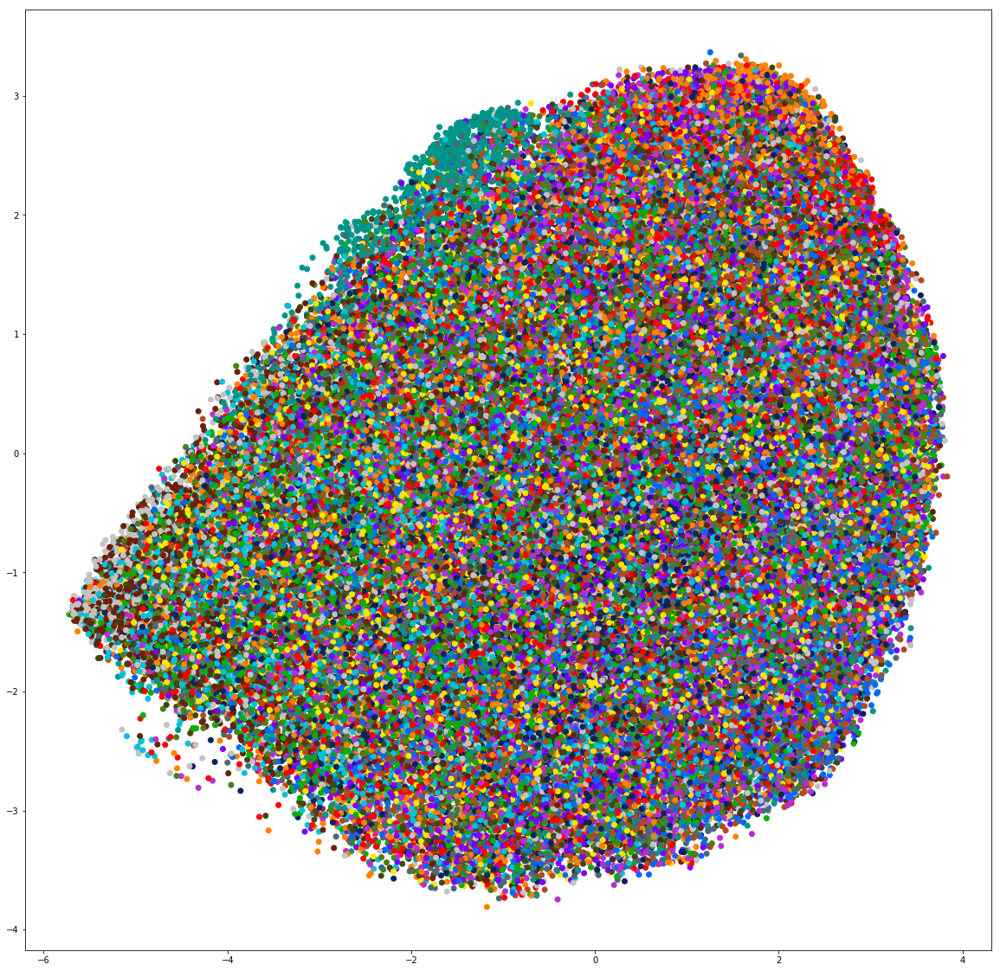

In [24]:
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(utils.get_dhs_colors()/255)
plt.figure(figsize=(20, 20))
plt.scatter(embedding[:, 0], embedding[:, 1], c=real_components[idx], cmap=cmap)

In [68]:
"\t".join([str(utils.get_order()[i]) for i in range(len(utils.get_order()))])

'7\t5\t15\t9\t12\t14\t3\t8\t13\t2\t4\t6\t16\t11\t10\t1'

In [70]:
order_string = "\t".join([str(utils.get_order()[i]) for i in range(len(utils.get_order()))]) + "\treal_component"
np.savetxt("/home/pbromley/generative_dhs/data_numpy/umap_mat.txt", umap_mat, fmt='%.2f', delimiter="\t",
           header=order_string, comments="")

In [57]:
umap_mat = np.concatenate((mat, (real_components+1).reshape(-1, 1)), axis=1)

In [74]:
for i in range(mat.shape[1]):
    print(utils.get_order()[i], end="\t")
    print(umap_mat[:, i][umap_mat[:, -1]==utils.get_order()[i]].mean(), end="\t")
    print(umap_mat[:, i][umap_mat[:, -1]!=utils.get_order()[i]].mean())

7	5.60406409305	5.5123684063
5	7.79024056636	7.48210602744
15	7.72508258807	7.42768258886
9	9.09359585155	8.8695655638
12	5.82615435172	5.62265934906
14	6.9730935997	6.76927183088
3	7.10480377404	7.0590859547
8	7.07019514855	6.72350197201
13	8.3927724427	7.77063764506
2	5.39426295777	5.30799077564
4	5.38756076362	5.30842472898
6	6.566090073	6.38514095734
16	9.07533159373	8.47237646216
11	7.87234993733	7.57069926606
10	5.43196454727	5.52496284927
1	5.47512736463	5.43255476718


In [16]:
a = np.loadtxt('second_sweep.txt')
loss = np.array([a[i*10:(i+1)*10] for i in range(16)])

In [28]:
loss.argmax(axis=1)[:, 0]
maxes = np.array([loss[i][loss.argmax(axis=1)[:, 0][i]] for i in range(16)])

(0.5, 1)

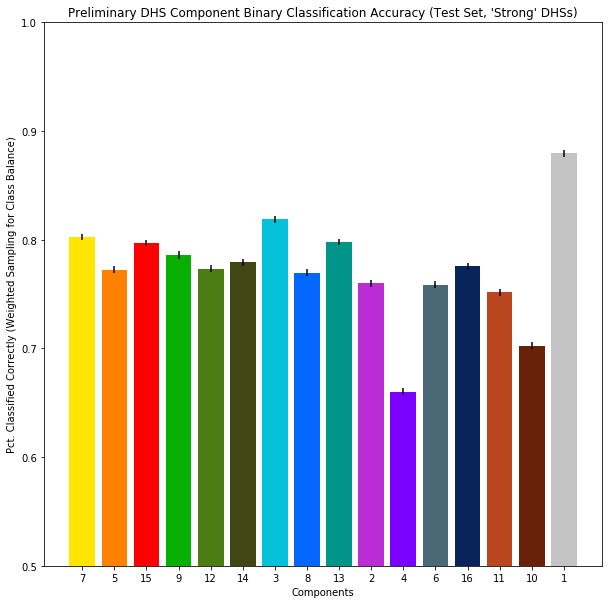

In [36]:
order = utils.get_order()
plt.figure(figsize=(10, 10))
plt.bar(np.arange(16), maxes[:, 0][order-1], yerr=maxes[:, 0]-maxes[:, 1], color=(utils.get_dhs_colors()/255)[order-1])
plt.title("Preliminary DHS Component Binary Classification Accuracy (Test Set, 'Strong' DHSs)")
plt.xlabel("Components")
plt.ylabel("Pct. Classified Correctly (Weighted Sampling for Class Balance)")
plt.xticks(np.arange(16), order)
plt.ylim(0.5, 1)

In [40]:
maxes[:, 0]-maxes[:, 2]

array([-0.00245908, -0.00332965, -0.00292301, -0.00365079, -0.00324401,
       -0.00331522, -0.00320042, -0.00332709, -0.00308826, -0.00340408,
       -0.0034593 , -0.00323651, -0.00314234, -0.00320734, -0.00323089,
       -0.00324939])

In [ ]:
import classifiers
# importlib.reload(classifiers)
from sklearn.metrics import precision_recall_curve, average_precision_score

In [13]:
model = classifiers.resnet_all()
model.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/classifiers/resnet_all3.pth"))
model.train(False)
model.to("cuda")

resnet_all(
  (net): Sequential(
    (0): Conv1d(4, 100, kernel_size=(11,), stride=(1,), padding=(5,))
    (1): ReLU(inplace)
    (2): resnet_block(
      (net): Sequential(
        (0): Conv1d(100, 100, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
        (1): ReLU()
        (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Conv1d(100, 100, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
        (4): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (relu): ReLU()
    )
    (3): MaxPool1d(kernel_size=25, stride=25, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_net): Sequential(
    (0): Linear(in_features=400, out_features=100, bias=True)
    (1): ReLU(inplace)
    (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=100, out_features=16, bias=True)
    (4): Softmax()
  )
)

In [44]:
x_train = np.load("/home/pbromley/generative_dhs/data_numpy/strong_one_hot_train.npy")
y_train = np.load("/home/pbromley/generative_dhs/data_numpy/strong_components_train.npy")
x_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_one_hot_test.npy")
y_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_components_test.npy")
x_train = x_train.transpose(0, 2, 1)
x_test = x_test.transpose(0, 2, 1)
nmf_train = np.load("/home/pbromley/generative_dhs/data_numpy/strong_nmfs_train.npy")
nmf_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_nmfs_test.npy")
mean_sig_train = np.load("/home/pbromley/generative_dhs/data_numpy/strong_sig_train.npy")[:, 0]
mean_sig_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_sig_test.npy")[:, 0]
total_sig_train = np.load("/home/pbromley/generative_dhs/data_numpy/strong_sig_train.npy")[:, 1]
total_sig_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_sig_test.npy")[:, 1]

In [18]:
comp = 3
comp_idx = (y_test == comp)

In [19]:
x_comp = x_test[comp_idx]
nmf_comp = nmf_test[comp_idx]
ms_comp = mean_sig_test[comp_idx]
ts_comp = total_sig_test[comp_idx]

model.eval()
comp_pred = np.zeros((comp_idx.sum(), 16))
for i in range(comp_idx.sum()//128):
    comp_pred[i*128:(i+1)*128] = model(torch.from_numpy(x_comp[i*128:(i+1)*128]).float().cuda()).detach().cpu().numpy()

comp_pred = comp_pred[:128*(comp_idx.sum()//128)]
nmf_comp = nmf_comp[:128*(comp_idx.sum()//128)]
x_comp = x_comp[:128*(comp_idx.sum()//128)]
ms_comp = ms_comp[:128*(comp_idx.sum()//128)]
ts_comp = ts_comp[:128*(comp_idx.sum()//128)]

correct_idx = (comp_pred.argmax(axis=1) == comp)
wrong_idx = (comp_pred.argmax(axis=1) != comp)

[ 30.03329223  30.47410604  19.72503083  19.7675709 ]
[ 28.80306905  28.69607843  21.15345269  21.34739983]


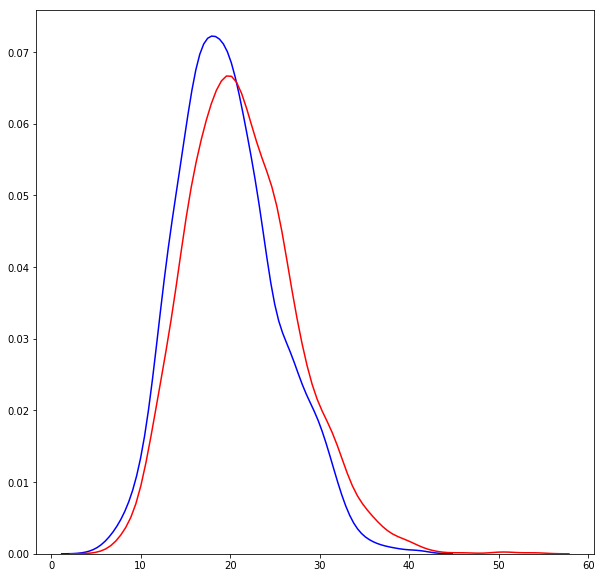

In [20]:
x_comp_t = x_comp.transpose(0, 2, 1)
x_comp_seqs = [utils.one_hot_to_seq(o) for o in x_comp_t]
print(utils.calc_overall_composition(list(compress(x_comp_seqs, correct_idx))))
print(utils.calc_overall_composition(list(compress(x_comp_seqs, wrong_idx))))
right_g, wrong_g = [], []
for i in range(len(x_comp_seqs)):
    if correct_idx[i]:
        right_g.append(utils.calc_overall_composition([x_comp_seqs[i]])[3])
    else:
        wrong_g.append(utils.calc_overall_composition([x_comp_seqs[i]])[3])

plt.figure(figsize=(10, 10))
sns.distplot(right_g, hist=False, color="blue")
sns.distplot(wrong_g, hist=False, color="red")

In [95]:
np.set_printoptions(linewidth=150, precision=2, suppress=True, threshold=2500)

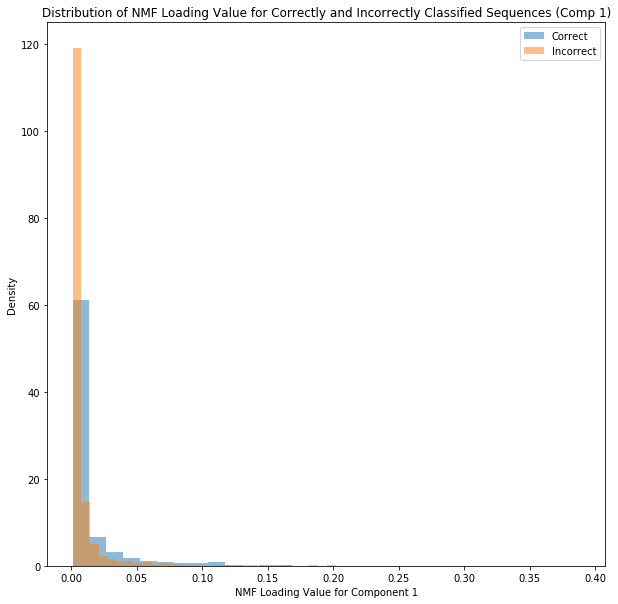

In [96]:
# Distribution of cardiac nmf loadings for correct, incorrect seqs
plt.figure(figsize=(10, 10))
plt.hist(nmf_comp[correct_idx, comp], bins=30, density=True, alpha=0.5)
plt.hist(nmf_comp[wrong_idx, comp], bins=30, density=True, alpha=0.5)
plt.title("Distribution of NMF Loading Value for Correctly and Incorrectly Classified Sequences (Comp {0})".format(comp+1))
plt.xlabel("NMF Loading Value for Component {0}".format(comp+1))
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

# Seems to be a slight trend showing higher nmf value sequences are easier to classify, but not super significant

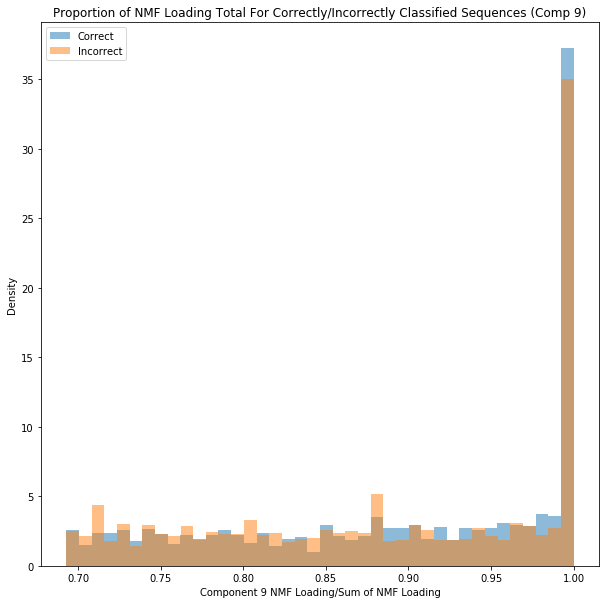

In [43]:
# Distribution of proportion of total NMF loading == 9's value
plt.figure(figsize=(10, 10))
plt.hist(nmf_comp[correct_idx, comp]/nmf_comp[correct_idx].sum(axis=1), bins=40, density=True, alpha=0.5)
plt.hist(nmf_comp[wrong_idx, comp]/nmf_comp[wrong_idx].sum(axis=1), bins=40, density=True, alpha=0.5)
# plt.hist(nmf_cardiac[correct_idx, 8] - np.delete(nmf_cardiac[correct_idx], 8, axis=1).sum(axis=1), bins=20, density=True, alpha=0.5)
# plt.hist(nmf_cardiac[wrong_idx, 8] - np.delete(nmf_cardiac[wrong_idx], 8, axis=1).sum(axis=1), bins=20, density=True, alpha=0.5)
plt.title("Proportion of NMF Loading Total For Correctly/Incorrectly Classified Sequences (Comp {0})".format(comp+1))
plt.xlabel("Component {0} NMF Loading/Sum of NMF Loading".format(comp+1))
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

# Much more of a separator than just taking strength of comp 9 nmf loading into account.  Seqs with strong comp 9, 
# weak everything else clearly somewhat easier to classify

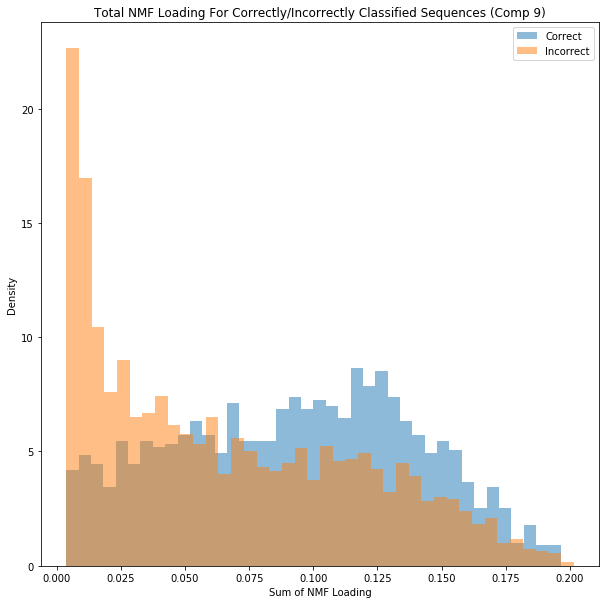

In [44]:
# Distribution of total NMF loading
plt.figure(figsize=(10, 10))
plt.hist(nmf_comp[correct_idx].sum(axis=1), bins=40, density=True, alpha=0.5)
plt.hist(nmf_comp[wrong_idx].sum(axis=1), bins=40, density=True, alpha=0.5)
# plt.hist(nmf_cardiac[correct_idx, 8] - np.delete(nmf_cardiac[correct_idx], 8, axis=1).sum(axis=1), bins=20, density=True, alpha=0.5)
# plt.hist(nmf_cardiac[wrong_idx, 8] - np.delete(nmf_cardiac[wrong_idx], 8, axis=1).sum(axis=1), bins=20, density=True, alpha=0.5)
plt.title("Total NMF Loading For Correctly/Incorrectly Classified Sequences (Comp {0})".format(comp+1))
plt.xlabel("Sum of NMF Loading")
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

Text(0.08,0.5,'Proportion')

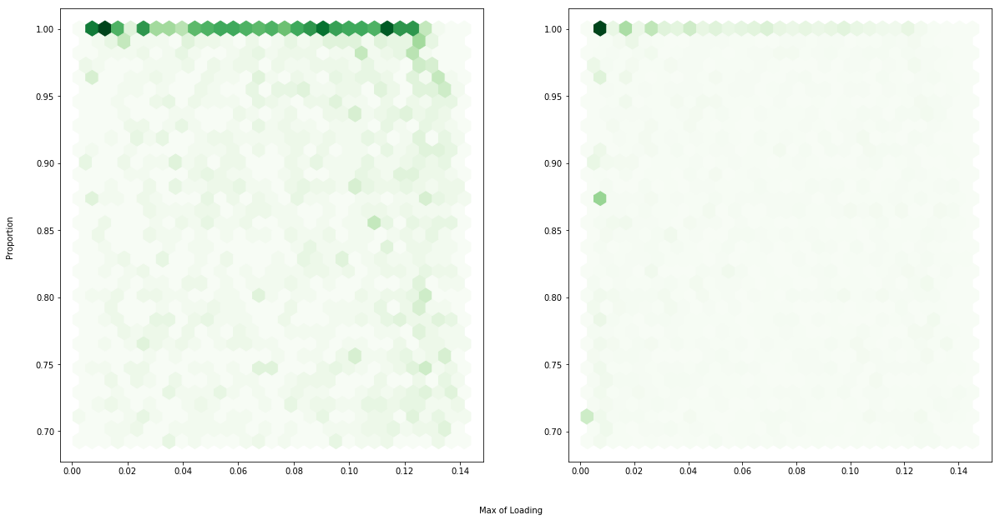

In [45]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].hexbin(nmf_comp[correct_idx, comp], nmf_comp[correct_idx, comp]/nmf_comp[correct_idx].sum(axis=1), gridsize=30, cmap="Greens")
ax[1].hexbin(nmf_comp[wrong_idx, comp], nmf_comp[wrong_idx, comp]/nmf_comp[wrong_idx].sum(axis=1), gridsize=30, cmap="Greens")
fig.text(0.5, 0.04, 'Max of Loading', ha='center')
fig.text(0.08, 0.5, 'Proportion', va='center', rotation='vertical')


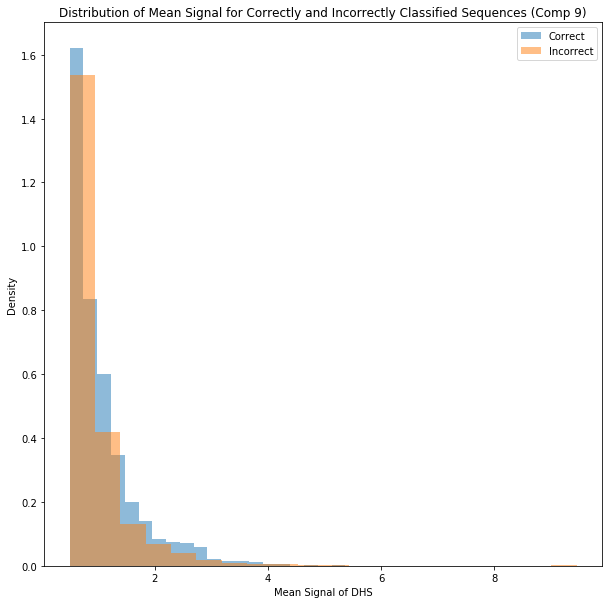

In [46]:
# Distribution of mean signal for correct, incorrect seqs (cardiac)
plt.figure(figsize=(10, 10))
plt.hist(ms_comp[correct_idx], bins=20, density=True, alpha=0.5, log=False)
plt.hist(ms_comp[wrong_idx], bins=20, density=True, alpha=0.5, log=False)
plt.title("Distribution of Mean Signal for Correctly and Incorrectly Classified Sequences (Comp {0})".format(comp+1))
plt.xlabel("Mean Signal of DHS")
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

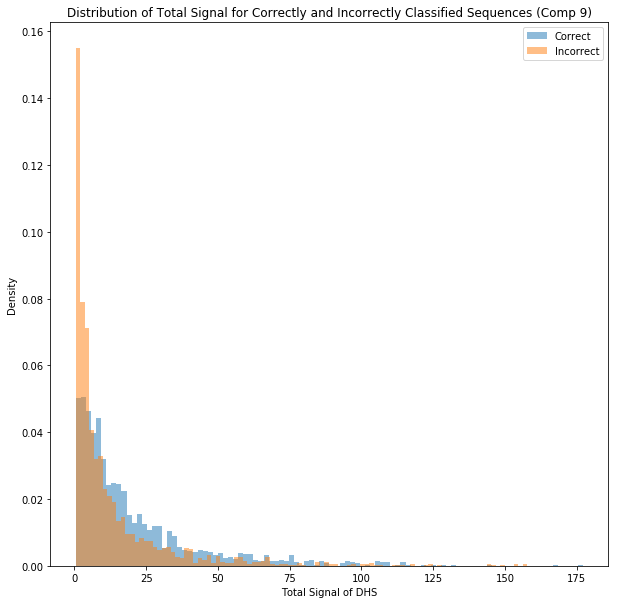

In [47]:
# Distribution of total signal for correct, incorrect seqs (cardiac)
plt.figure(figsize=(10, 10))
plt.hist(ts_comp[correct_idx], bins=100, alpha=0.5, density=True)
plt.hist(ts_comp[wrong_idx], bins=100, alpha=0.5, density=True)
plt.title("Distribution of Total Signal for Correctly and Incorrectly Classified Sequences (Comp 9)")
plt.xlabel("Total Signal of DHS")
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

In [49]:
# Motif scan mef2a over cardiac sequences (right and wrong)
mef2a = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/V_MEF2_02.txt")[:, np.array([0, 3, 1, 2])]
m = utils.MotifMatch(mef2a)
mef_correct = np.zeros(correct_idx.sum())
mef_wrong = np.zeros(wrong_idx.sum())
motif_x_comp = x_comp.transpose(0, 2, 1)
for i in range(len(mef_correct)):
    mef_correct[i] = m(torch.FloatTensor(motif_x_comp[correct_idx][i].reshape(1, 1, 100, 4))).item()
for i in range(len(mef_wrong)):
    mef_wrong[i] = m(torch.FloatTensor(motif_x_comp[wrong_idx][i].reshape(1, 1, 100, 4))).item()

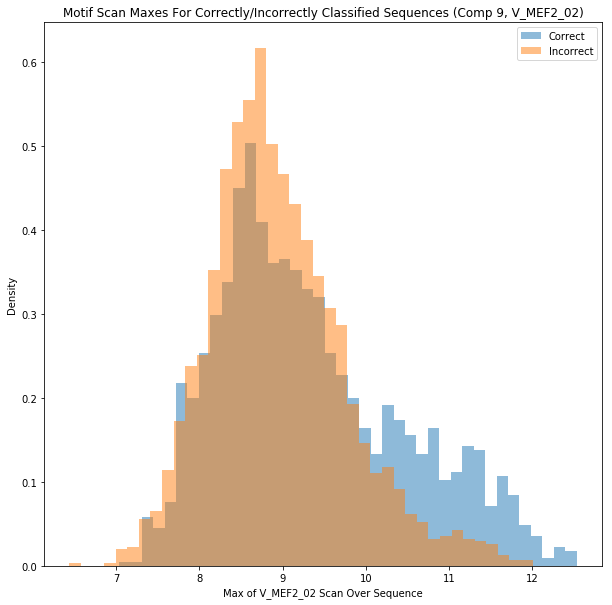

In [50]:
# Distribution of motif scans over right and wrong 
plt.figure(figsize=(10, 10))
plt.hist(mef_correct, bins=40, density=True, alpha=0.5)
plt.hist(mef_wrong, bins=40, density=True, alpha=0.5)
plt.title("Motif Scan Maxes For Correctly/Incorrectly Classified Sequences (Comp 9, V_MEF2_02)")
plt.xlabel("Max of V_MEF2_02 Scan Over Sequence")
plt.ylabel("Density")
plt.legend(["Correct", "Incorrect"])

In [133]:
x_comp.shape

(3840, 4, 100)

In [ ]:
# for num in utils.get_order()
#     comp = num - 1
#     comp_idx = (y_test == comp)
    
#     x_comp = x_test[comp_idx]
#     nmf_comp = nmf_test[comp_idx]
#     ms_comp = mean_sig_test[comp_idx]
#     ts_comp = total_sig_test[comp_idx]

#     model.eval()
#     comp_pred = np.zeros((comp_idx.sum(), 16))
#     for i in range(comp_idx.sum()//128):
#         comp_pred[i*128:(i+1)*128] = model(torch.from_numpy(x_comp[i*128:(i+1)*128]).float().cuda()).detach().cpu().numpy()

#     comp_pred = comp_pred[:128*(comp_idx.sum()//128)]
#     nmf_comp = nmf_comp[:128*(comp_idx.sum()//128)]
#     x_comp = x_comp[:128*(comp_idx.sum()//128)]
#     ms_comp = ms_comp[:128*(comp_idx.sum()//128)]
#     ts_comp = ts_comp[:128*(comp_idx.sum()//128)]

#     correct_idx = (comp_pred.argmax(axis=1) == comp)
#     wrong_idx = (comp_pred.argmax(axis=1) != comp)
    
#     # Loading Val
#     plt.figure(figsize=(10, 10))
#     plt.hist(nmf_comp[correct_idx, comp], bins=30, density=True, alpha=0.5)
#     plt.hist(nmf_comp[wrong_idx, comp], bins=30, density=True, alpha=0.5)
#     plt.title("Distribution of NMF Loading Value for Correctly and Incorrectly Classified Sequences (Comp {0})".format(num))
#     plt.xlabel("NMF Loading Value for Component {0}".format(num))
#     plt.ylabel("Density")
#     plt.legend(["Correct", "Incorrect"])
#     plt.savefig("/home/pbromley/generative_dhs/images/")

In [23]:
import pandas as pd
import utils

In [68]:
out = pd.read_csv("/home/pbromley/generative_dhs/memes/new_memes/out.txt", sep="\t", header=None)

Text(0.5,1,'FIMO Motif Occurences for Real Component Specific Sequences')

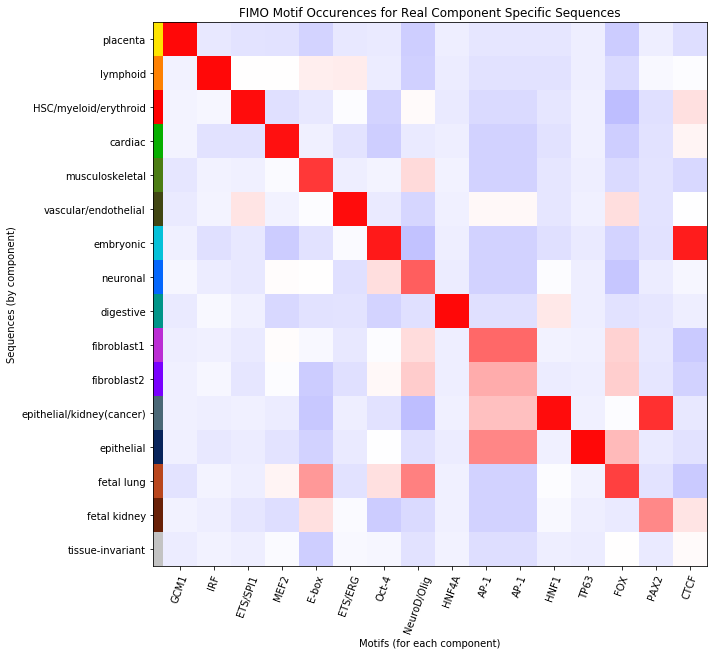

In [70]:
#TODO
count_mat = np.zeros((16, 16))
order = utils.get_order()
motifs = utils.get_motifs()
for i in range(16):
    count_mat[:, i] = out[out[3] == (motifs[i] + ".meme")][1].values[order-1]
    
norm_count_mat = (count_mat-count_mat.mean(axis=0))/count_mat.std(axis=0)
# norm_count_mat = count_mat/count_mat.max(axis=0)
plt.figure(figsize=(10, 10))
plt.imshow(norm_count_mat, cmap="bwr", vmin=-4, vmax=4)
plt.xlabel("Motifs (for each component)")
plt.ylabel("Sequences (by component)")
plt.xticks(np.arange(16), [utils.get_abbrev_motifs()[i] for i in range(16)], rotation=70)
plt.yticks(np.arange(16), [utils.get_component_class_names()[i] for i in range(16)])
plt.barh(np.arange(16), width=0.3, height=1, left=-0.8, color=utils.get_dhs_colors()[order-1])
plt.xlim(-0.8, 15.5)
plt.title("FIMO Motif Occurences for Real Component Specific Sequences")
# plt.savefig("/home/pbromley/generative_dhs/figures/motif_dists/fimo_grid_bwr_synth.pdf", format='pdf')

In [75]:
x_train, y_train, _, _ = data_helper.load_the_data('strong')

In [14]:
real_seqs = [utils.one_hot_to_seq(o) for o in x_test.transpose(0, 2, 1)]

In [15]:
composition = [utils.calc_overall_composition([real_seqs[i]])[:2].sum()/utils.calc_overall_composition([real_seqs[i]])[2:].sum() for i in range(len(real_seqs))]

(0, 10)

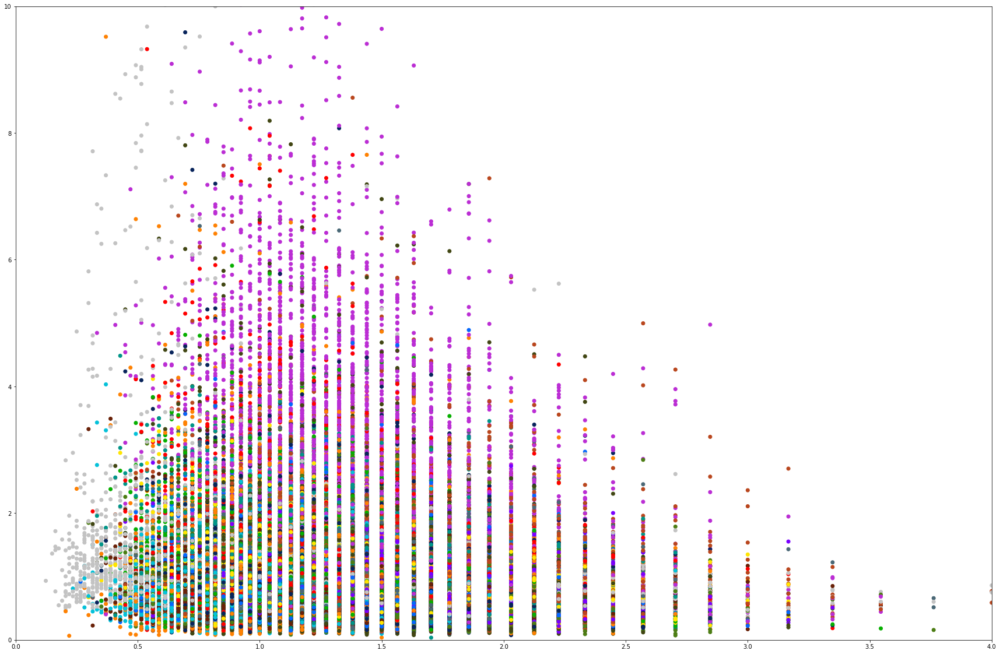

In [16]:
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(utils.get_dhs_colors()/255)
plt.figure(figsize=(30, 20))
plt.scatter(composition, mean_sig_test, c=y_test, cmap=cmap,)
plt.xlim(0, 4)
plt.ylim(0, 10)

In [99]:
# USE NEW DATA FOR NEXT 2 PLOTS
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(utils.get_dhs_colors()/255)
n_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_nmfs_test.npy")
ms_test = np.load("/home/pbromley/generative_dhs/data_numpy/strong_sig_test.npy")[:, 0]
y_t = np.load("/home/pbromley/generative_dhs/data_numpy/strong_components_test.npy")

Text(0.5,1,'Loading Val vs. Proportion')

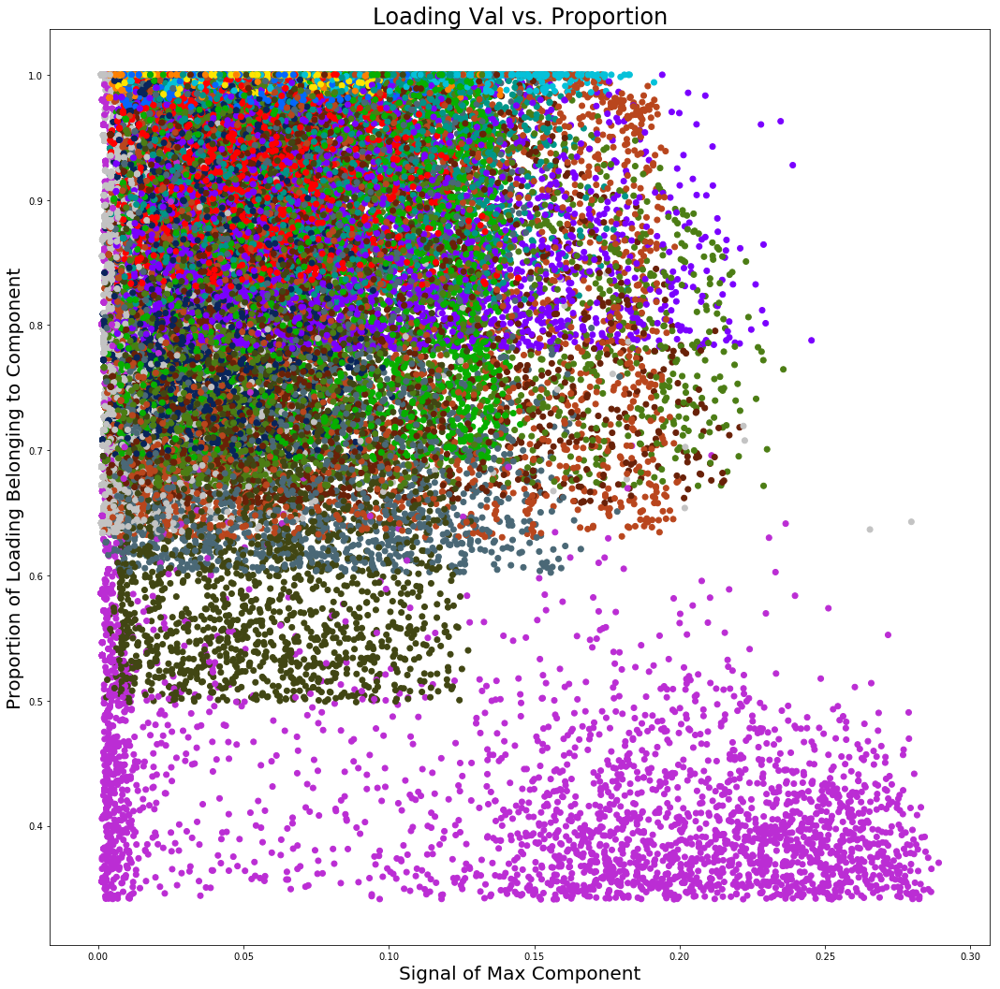

In [102]:
plt.figure(figsize=(18, 18))
plt.scatter(n_test.max(axis=1), n_test.max(axis=1)/n_test.sum(axis=1), c=y_t, cmap=cmap)
plt.ylabel("Proportion of Loading Belonging to Component", fontsize=20)
plt.xlabel("Signal of Max Component", fontsize=20)
plt.title("Loading Val vs. Proportion", fontsize=24)



(0, 15)

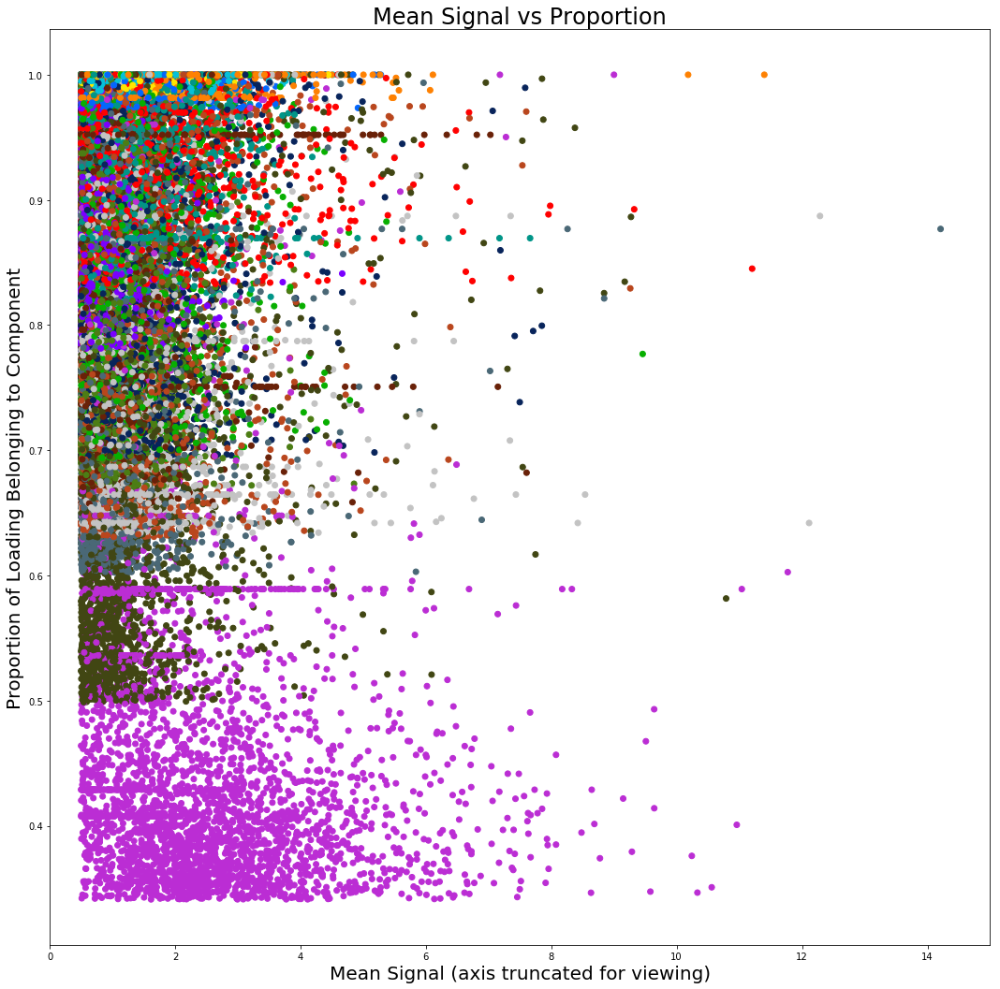

In [106]:
plt.figure(figsize=(18, 18))
plt.scatter(ms_test, n_test.max(axis=1)/n_test.sum(axis=1),  c=y_t, cmap=cmap)
plt.ylabel("Proportion of Loading Belonging to Component", fontsize=20)
plt.xlabel("Mean Signal (axis truncated for viewing)", fontsize=20)
plt.title("Mean Signal vs Proportion", fontsize=24)
plt.xlim(0, 15)

Text(0.5,0,'Signal of Max Component')

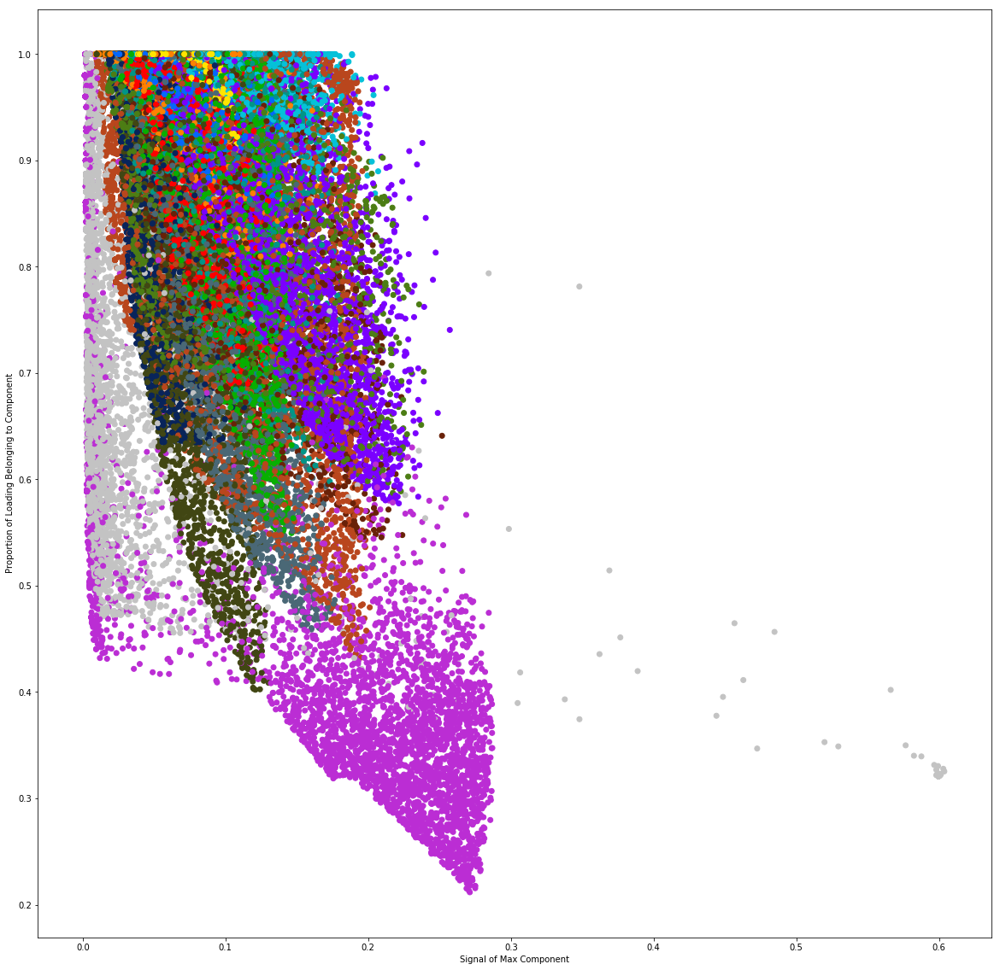

In [12]:
plt.figure(figsize=(20, 20))
plt.scatter(nmf_test.max(axis=1), nmf_test.max(axis=1)/nmf_test.sum(axis=1), c=y_test, cmap=cmap)
plt.ylabel("Proportion of Loading Belonging to Component")
plt.xlabel("Signal of Max Component")


(0.5, 15)

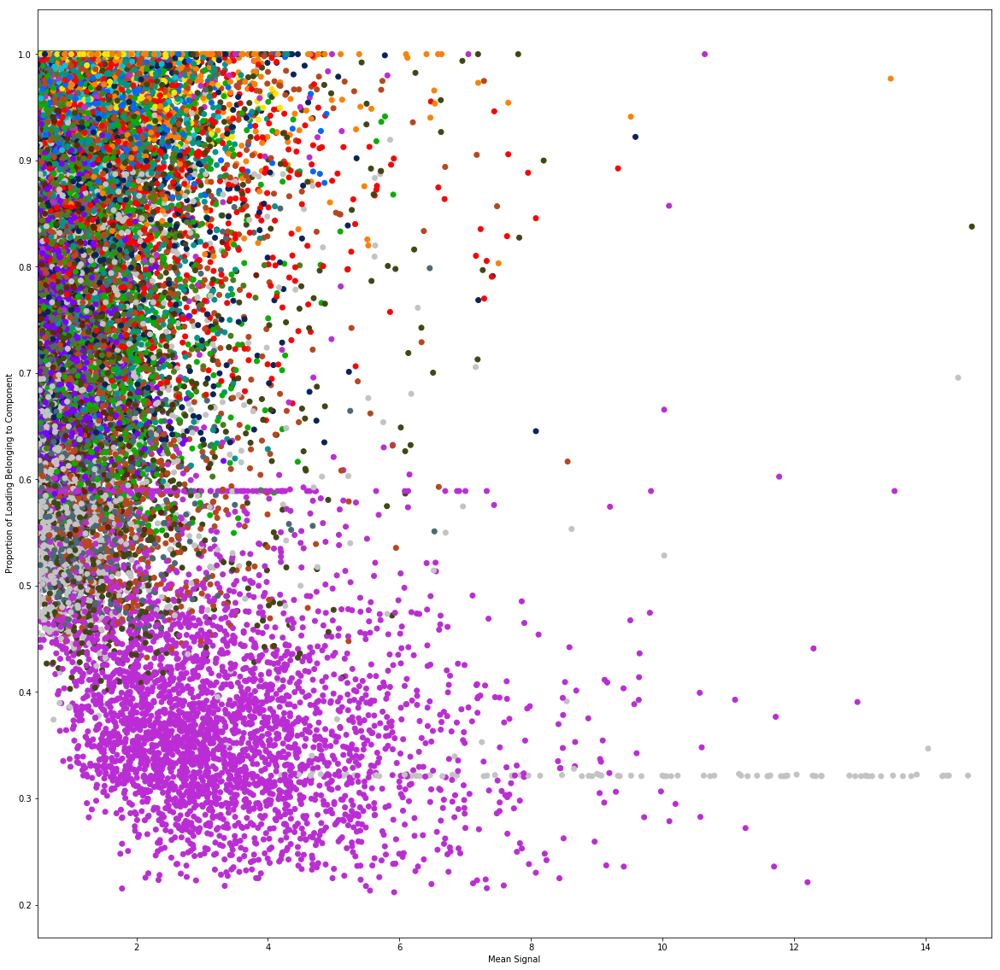

In [17]:
plt.figure(figsize=(20, 20))
plt.scatter(mean_sig_test, nmf_test.max(axis=1)/nmf_test.sum(axis=1), c=y_test, cmap=cmap)
plt.ylabel("Proportion of Loading Belonging to Component")
plt.xlabel("Mean Signal")
plt.xlim(0.5, 15)

In [166]:
np.ceil(np.sqrt(len(utils.get_order())))

4.0

In [124]:
(comp_pred[(comp_pred.max(axis=1) == 1.0)].argmax(1) == 8).mean()

0.6106246351430239

In [125]:
(comp_pred.max(axis=1) == 1.0).mean()

0.44609375000000001

In [23]:
import pandas as pd

In [24]:
sweep = pd.read_csv("/home/pbromley/generative_dhs/notebooks/sweep2.txt", header=None, sep="\t")
sweep.loc[sweep[0] == 0, 0] = 10000

In [25]:
to_100 = sweep.groupby([2, 3, 4]).mean()[0].values
final = sweep.groupby([2, 3, 4]).mean()[1].values
ref = sweep.groupby([2, 3, 4]).mean().index.values
ref = np.array([list(t) for t in ref])

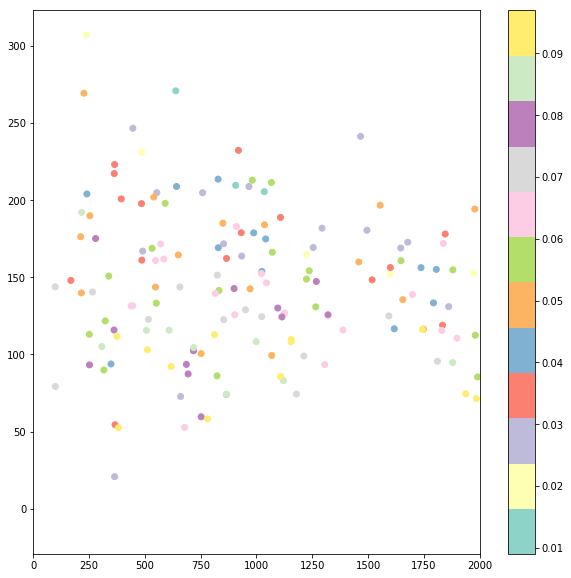

In [26]:
plt.figure(figsize=(10, 10))
plt.scatter(to_100, final, c=ref[:, 0], cmap='Set3')
plt.xlim(0, 2000)
plt.colorbar()

In [27]:
r1 = to_100.argsort()
r2 = final.argsort()[::-1]
coranking = np.zeros(len(r1))
for i in range(len(r1)):
    coranking[r1[i]] += i
    coranking[r2[i]] += i
idx = coranking.argsort()

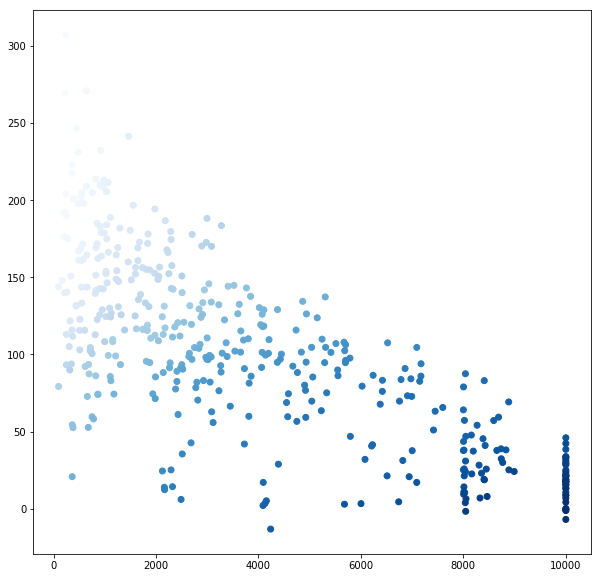

In [12]:
plt.figure(figsize=(10, 10))
plt.scatter(to_100[idx], final[idx], c=np.arange(len(r1)), cmap="Blues")

In [28]:
ref[idx][:50]

array([[ 0.017,  0.8  ,  0.59 ],
       [ 0.049,  0.6  ,  0.79 ],
       [ 0.041,  0.9  ,  0.79 ],
       [ 0.033,  0.8  ,  0.69 ],
       [ 0.033,  0.7  ,  0.69 ],
       [ 0.089,  0.7  ,  0.69 ],
       [ 0.025,  0.8  ,  0.69 ],
       [ 0.049,  0.9  ,  0.89 ],
       [ 0.017,  0.9  ,  0.79 ],
       [ 0.049,  0.8  ,  0.69 ],
       [ 0.033,  0.7  ,  0.59 ],
       [ 0.009,  0.9  ,  0.69 ],
       [ 0.033,  0.9  ,  0.79 ],
       [ 0.081,  0.8  ,  0.79 ],
       [ 0.049,  0.7  ,  0.69 ],
       [ 0.025,  0.9  ,  0.79 ],
       [ 0.041,  0.7  ,  0.59 ],
       [ 0.057,  0.5  ,  0.59 ],
       [ 0.041,  0.5  ,  0.59 ],
       [ 0.025,  0.6  ,  0.59 ],
       [ 0.033,  0.5  ,  0.59 ],
       [ 0.033,  0.8  ,  0.59 ],
       [ 0.009,  0.8  ,  0.59 ],
       [ 0.025,  0.8  ,  0.59 ],
       [ 0.057,  0.6  ,  0.59 ],
       [ 0.065,  0.7  ,  0.69 ],
       [ 0.073,  0.6  ,  0.59 ],
       [ 0.033,  0.6  ,  0.69 ],
       [ 0.057,  0.6  ,  0.79 ],
       [ 0.025,  0.7  ,  0.59 ],
       [ 0

In [135]:
to_100[idx][:50]

array([ 160.2,  151.6,  167.6,  167.4,   77.8,  156. ,  123.8,  265. ,
        225.2,  267. ,  274. ,   72.6,  149.2,  270.2,  207. ,  238.6,
        211.6,  331.4,  386.6,  319. ,  330.2,  325. ,  393.6,  340.4,
        403.8,  288.4,  328.8,  208.8,  419.4,  280.6,  286. ,  458.8,
        448. ,  127.4,  153. ,  492. ,  492.2,  327.8,  242.2,  408.6,
        394.6,  310. ,  454.6,  516.2,  288.6,  419.6,  419.4,  570.4,
        297.2,  479.6])

In [136]:
final[idx][:50]

array([ 242.076,  228.216,  230.004,  229.482,  198.484,  206.94 ,
        191.844,  243.556,  212.832,  240.492,  218.812,  166.936,
        171.192,  210.53 ,  182.016,  185.838,  180.602,  213.094,
        234.716,  195.034,  197.348,  189.676,  216.59 ,  189.054,
        214.986,  176.45 ,  185.468,  155.554,  210.588,  164.11 ,
        164.896,  216.058,  210.228,  139.028,  139.324,  223.412,
        216.072,  163.954,  142.696,  172.532,  168.424,  151.198,
        184.896,  200.524,  145.15 ,  169.53 ,  166.416,  207.274,
        142.494,  179.292])

In [141]:
np.arange(0.007, 0.07, 0.005)
np.arange(0.3, 1.0, 0.1)
np.arange(0.39, 0.9, 0.1)

array([ 0.39,  0.49,  0.59,  0.69,  0.79,  0.89])

In [142]:
13*7*6

546

In [143]:
seqs = np.load("/home/pbromley/generative_dhs/optimized/seqs-9.npy")

In [152]:
[utils.one_hot_to_seq(o) for o in seqs]

[Seq('GCATATCGAGTGCTCGTTCGGCAGAGCCCAGGGTGCACAGTGAGACTTATCTAC...CAC', SingleLetterAlphabet()),
 Seq('GCGAAGGGACAGTGAAAGGAATGGACAGTATGACAGCTATAAATAGCACCTTCG...TCA', SingleLetterAlphabet()),
 Seq('CGGGCCAGTCGAGGGGCCTGAGAGGCAGCAGGCCTGTGACACTCACTTCAGCTG...GCT', SingleLetterAlphabet()),
 Seq('AGTGCATTCTATATATAGACCCTGAGAGGTGCCACGTGACAGATACGAAGAGTC...ACC', SingleLetterAlphabet()),
 Seq('AGCCCCAGTTAGCTAGTGTTCCTGAGTGTCTGTGATATGGCGAGAGCTCGATAA...CAG', SingleLetterAlphabet()),
 Seq('AGGTATCTGGCTTATCTGGCAGCAGGCCACGAGGTGAGTGTCAGGCAGCACGTG...GTG', SingleLetterAlphabet()),
 Seq('TGGGTTCCAAATATAGCACGTGACAGATAGGCATCGACACTTAGGCATACAGGC...GAG', SingleLetterAlphabet()),
 Seq('TGTCAGCCACTTTGCCTTACTGAAAATACCACTTCAGCTGATAGCAAGTGCCAG...TAA', SingleLetterAlphabet()),
 Seq('GCAGTAAGGAGGGCAGGCAGAGGGGCCTGGACACTTCAAGTGTCCGGACCTGTC...TAC', SingleLetterAlphabet()),
 Seq('AGTGCTCGACAGCATACCTATATTTAGCATAGTGCCGTAGGTACCAGGCGAGTG...TAC', SingleLetterAlphabet()),
 Seq('TCTCAGGCAGTTCGACAGATAGGACCTGAGTGAACGTCAACACCACATTGAGTG

In [218]:
with open("tmp.txt", "w") as t:
    for i in range(20):
        t.write("hello\n")

In [228]:
d = torch.load("/home/pbromley/generative_dhs/saved_models/classifiers/resnet_all3.pth")
for key in d.keys():
    print(key)
    print(d[key].shape)



net.0.weight
torch.Size([100, 4, 11])
net.0.bias
torch.Size([100])
net.2.net.0.weight
torch.Size([100, 100, 5])
net.2.net.2.weight
torch.Size([100])
net.2.net.2.bias
torch.Size([100])
net.2.net.2.running_mean
torch.Size([100])
net.2.net.2.running_var
torch.Size([100])
net.2.net.3.weight
torch.Size([100, 100, 5])
net.2.net.4.weight
torch.Size([100])
net.2.net.4.bias
torch.Size([100])
net.2.net.4.running_mean
torch.Size([100])
net.2.net.4.running_var
torch.Size([100])
fc_net.0.weight
torch.Size([100, 400])
fc_net.0.bias
torch.Size([100])
fc_net.2.weight
torch.Size([100])
fc_net.2.bias
torch.Size([100])
fc_net.2.running_mean
torch.Size([100])
fc_net.2.running_var
torch.Size([100])
fc_net.3.weight
torch.Size([16, 100])
fc_net.3.bias
torch.Size([16])


In [71]:
importlib.reload(data_helper)

<module 'data_helper' from '/home/pbromley/generative_dhs/notebooks/data_helper.py'>

In [78]:
xtr, ytr, xte, yte = data_helper.load_the_data('strong', rc=True)

In [88]:
print([utils.one_hot_to_seq(o).reverse_complement() for o in xtr[0:10]])
print([utils.one_hot_to_seq(o) for o in xtr[256000:256010]])

[Seq('ACTAAAGCTATACTCTCCCTAGATGTTCCCCAAGAGGGAAACCCCCCACGAACT...AGA', SingleLetterAlphabet()), Seq('CCAAAAGGGGTTCAAAGGTTGGATGGACTCAACTGCCACACCCTGTGCAATGCG...TTA', SingleLetterAlphabet()), Seq('TTTCTTACTGGCGGTGGAAGACATCAAAAGGCAATATAAAGACTGAGTGGAAGC...TGG', SingleLetterAlphabet()), Seq('TTGTATTGTGGATTAACTGTGAGGCACCCATTCCACCCTGCAGTGTGTCTTATA...ACA', SingleLetterAlphabet()), Seq('AAAGCCAAGAGAAAAACAGTTTTTACTACATGTTGCTGGAGCAGAATCTTATTA...AAA', SingleLetterAlphabet()), Seq('TTCTAGAGAAAGGAGGGAAAGTTTGGCTCCTGAGAAGAAAACAGGAACAGAAGC...CTT', SingleLetterAlphabet()), Seq('CACCTGACGGTATGAATGACAGGCTGGAGAGAGGGACACTAATTAGTAGGCCTG...GGA', SingleLetterAlphabet()), Seq('ACAAAAACTCTGCCAATTTGATAAGTTAAAAATTATATCTTGTTTTAATTTGCT...TTT', SingleLetterAlphabet()), Seq('TGCCAAGAAAACTCAAAAGAACAAGATTTTCTGAATGATTTCCAGTGTTTCTTC...AAA', SingleLetterAlphabet()), Seq('AGACCTCTTTTATAAGGACGCCAGTTCCATTCAAGAGGGCACTGCCTGCATTCC...GTG', SingleLetterAlphabet())]
[Seq('ACTAAAGCTATACTCTCCCTAGATGTTCCCCAAGAGGGAAACCCCCCACGAACT...AGA', 

In [100]:
import cgan_trainer

In [102]:
G = cgan_trainer.snp_generator_2d(100, 4, 64, 320, 11)
G.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/conditional_gan_strong-g.pth"))
G.train(False)
G.to("cuda")

snp_generator_2d(
  (embed): Embedding(16, 4)
  (fc): SpectralNorm(
    (module): Linear(in_features=100, out_features=1600, bias=True)
  )
  (relu1): ReLU(inplace)
  (cbn1): CBN(
    (fc_gamma): Sequential(
      (0): Linear(in_features=4, out_features=64, bias=True)
      (1): ReLU(inplace)
      (2): Linear(in_features=64, out_features=160, bias=True)
    )
    (fc_beta): Sequential(
      (0): Linear(in_features=4, out_features=64, bias=True)
      (1): ReLU(inplace)
      (2): Linear(in_features=64, out_features=160, bias=True)
    )
  )
  (up1): SpectralNorm(
    (module): ConvTranspose2d(160, 320, kernel_size=(10, 1), stride=(10, 10), bias=False)
  )
  (relu2): ReLU(inplace)
  (cbn2): CBN(
    (fc_gamma): Sequential(
      (0): Linear(in_features=4, out_features=64, bias=True)
      (1): ReLU(inplace)
      (2): Linear(in_features=64, out_features=320, bias=True)
    )
    (fc_beta): Sequential(
      (0): Linear(in_features=4, out_features=64, bias=True)
      (1): ReLU(inplace

In [ ]:
# G.to("cpu")
one_hot_seqs = np.zeros((64000, 1, 100, 4))
cs = np.random.randint(0, 16, 64000)
for i in range(500):
    noise = torch.from_numpy(np.random.normal(0, 1, (128, 100))).float().cuda()
    c = torch.from_numpy(cs[i*128:(i+1)*128]).long().cuda()
    with torch.no_grad():
        one_hot_seqs[i*128:(i+1)*128] = G(noise, c).detach().cpu().numpy()

one_hot_seqs = one_hot_seqs.reshape(-1, 100, 4)

print("Converting one-hot to normal...")
seqs = [utils.one_hot_to_seq(one_hot_seq) for one_hot_seq in one_hot_seqs]

In [112]:
s = [utils.one_hot_to_seq(o) for o in one_hot_seqs[cs == 10]]
utils.calc_overall_composition(s)

array([ 32.19,  30.8 ,  12.79,  24.22])

In [63]:
def rainbow_text(x, y, strings, colors, boxes, ax=None, **kw):
    if ax is None:
        ax = plt.gca()
    t = ax.transData
    canvas = ax.figure.canvas

    # horizontal version
    for s, c, b in zip(strings, colors, boxes):
        text = ax.text(x, y, s, color=c, transform=t, bbox=b, fontsize=12, family='monospace', **kw)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        t = transforms.offset_copy(text._transform, x=ex.width, units="dots")

def split_seq_helper(seq, c):
    s = seq.reshape(1, 1, 100, 4)
    raw_seq = utils.one_hot_to_seq(seq)
    motif = utils.get_motif_from_comp(c, ext=True)
    motif_mat = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/" + motif)[:, np.array([0, 3, 1, 2])]
    m = utils.MotifMatch(motif_mat, where=True)
    strength, idx, strand = m(torch.from_numpy(s).float())
    col = "green"
    if strand == "-":
        idx -= (motif_mat.shape[0]-1)
        col = "red"
    
    l = max(idx, 0)
    r = min(idx+motif_mat.shape[0], 100)
    before = raw_seq[0:l]
    highlight = raw_seq[l:r]
    after = raw_seq[r:]

    high = utils.get_rough_motif_ranges()[c][1]
    low = utils.get_rough_motif_ranges()[c][0]
    strength_norm = (strength-low)/(high-low)
    strength_norm = max(strength_norm, 0)
    strength_norm = min(strength_norm, 1)
    return [(before, "black", None), (highlight, col, {'facecolor':'yellow', 'alpha':strength_norm}), (after, "black", None)]


def plot_seq(seq, c, pos):
    split = split_seq_helper(seq, c)
    l1, l2, l3 = [], [], []
    for i in range(len(split)):
        l1 += [split[i][0]]
        l2 += [split[i][1]]
        l3 += [split[i][2]]
    rainbow_text(0, 0.0206*pos, l1, l2, l3)

In [129]:
f = open("/home/pbromley/generative_dhs/notebooks/track/3-4.txt", "r")
s = []
for line in f:
    s.append(Seq(line[:-1]))
f.close()

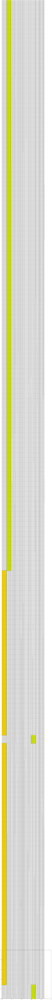

In [130]:
plt.figure(figsize=(15, 15))
for i in range(len(s)):
    plot_seq(utils.seq_to_one_hot(s[i]), 3, i)

In [461]:
seq_array = []
for i in range(len(s)):
    seq_array.append(SeqRecord(s[i], id=str(i)))
SeqIO.write(seq_array, "/home/pbromley/generative_dhs/memes/new_memes/digestive.fasta", "fasta")

500

In [455]:
motif = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/JDP2_bZIP_1.txt")[:, np.array([0, 3, 1, 2])]

In [365]:
class MotifMatch(nn.Module):
    def __init__(self, pwm, where=False):
        super(MotifMatch, self).__init__()
        self.motif_length = pwm.shape[0]
        kernel = pwm.reshape(1, 1, self.motif_length, 4)
        self.kernel = nn.Parameter(data=torch.FloatTensor(kernel), requires_grad=False)
        self.where = where

    def forward(self, x):
        seq = utils.one_hot_to_seq(x.cpu().numpy().squeeze())
        rc_seq = seq.reverse_complement()
        rc_seq_one_hot = torch.FloatTensor(utils.seq_to_one_hot(rc_seq).reshape(1, 1, x.size(2), x.size(3)))
        conv1 = F.conv2d(x, self.kernel, padding=(self.motif_length-1, 0))
        conv2 = F.conv2d(rc_seq_one_hot, self.kernel, padding=(self.motif_length-1, 0))
        conv = torch.cat([conv1, conv2], 2)
        out = torch.max(conv)
        if self.where:
            l = conv1.size(2)
            idx = torch.argmax(conv)
            loc = (idx % l)-(self.motif_length-1)
            if idx >= l:
                strand = "-"
                loc = (len(seq)-1) - loc
            else:
                strand = "+"
            return out.squeeze(), loc, strand
        else:
            return out.squeeze()

In [382]:
m = MotifMatch(motif, where=True)
m(torch.FloatTensor(utils.seq_to_one_hot(Seq("T"*21 + "ATGACTCAT" + "T"*70).reverse_complement()).reshape(1, 1, 100, 4)))

tensor(137)
tensor(78)


(tensor(8.1844), tensor(78), '-')

In [20]:
model = classifiers.tmp(0.2)
model.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/classifiers/aug.pth"))
model.train(False)
model.to("cuda")

tmp(
  (net): Sequential(
    (0): Conv1d(4, 512, kernel_size=(17,), stride=(1,), padding=(8,))
    (1): ReLU(inplace)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool1d(kernel_size=100, stride=100, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_net): Sequential(
    (0): Linear(in_features=512, out_features=100, bias=True)
    (1): ReLU(inplace)
    (2): Dropout(p=0.2)
    (3): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): Linear(in_features=100, out_features=16, bias=True)
    (5): Softmax()
  )
)

In [7]:
G = gen_models.snp_generator_2d_temp_2a(100, 100, 11)
G.load_state_dict(torch.load("/home/pbromley/generative_dhs/saved_models/no-condition-strong2dg-g.pth"))
G.train(False)
G.to("cuda")

snp_generator_2d_temp_2a(
  (fc): Linear(in_features=100, out_features=500, bias=True)
  (relu1): ReLU(inplace)
  (bn1): BatchNorm2d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up1): ConvTranspose2d(50, 100, kernel_size=(10, 1), stride=(10, 10), bias=False)
  (relu2): ReLU(inplace)
  (bn2): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up2): ConvTranspose2d(100, 1, kernel_size=(11, 4), stride=(1, 1), padding=(5, 0))
  (softmax): Softmax()
)

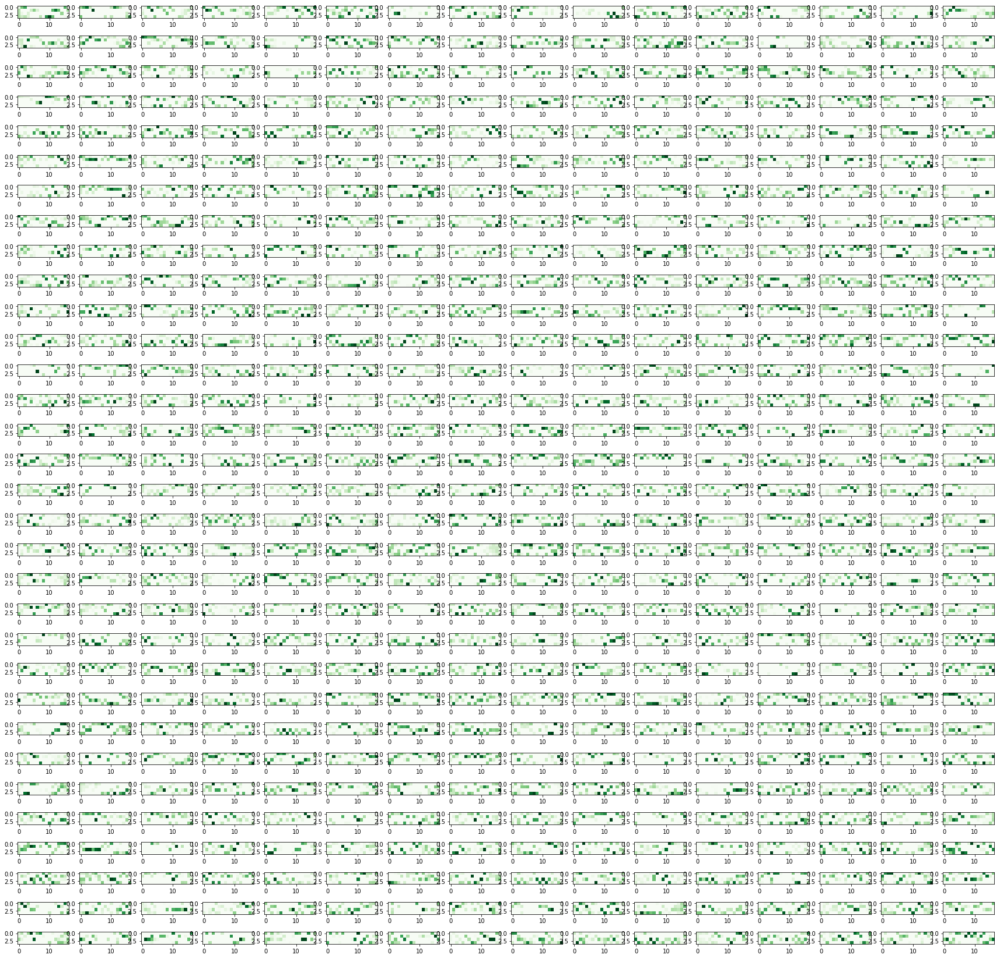

In [133]:
model.to('cpu')
fig, ax = plt.subplots(32, 16, figsize=(30, 30))
s = []
for i in range(512):
    seq = model.state_dict()['net.0.weight'][i].squeeze().numpy()
    ax[i//16][i%16].imshow(seq, cmap='Greens', vmin=0)
    s.append(utils.one_hot_to_seq(seq.transpose()))
    
    

In [117]:
seq_array = []
for i in range(len(s)):
    seq_array.append(SeqRecord(s[i], id=str(i)))
SeqIO.write(seq_array, "/home/pbromley/generative_dhs/memes/new_memes/filters_long.fasta", "fasta")

512

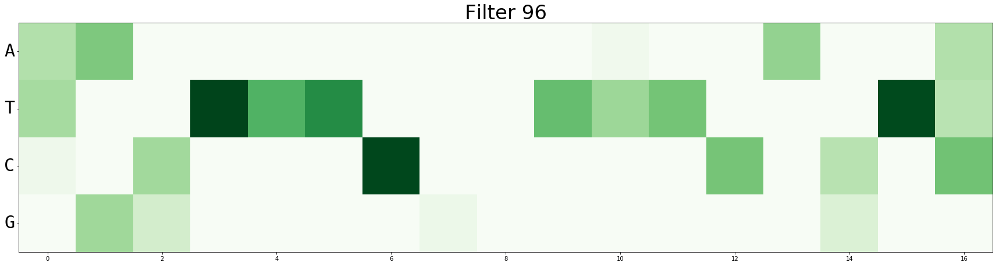

In [45]:
seq = model.state_dict()['net.0.weight'][354].squeeze().cpu().numpy()
plt.figure(figsize=(30, 10))
plt.imshow(seq, cmap='Greens', vmin=0)

plt.title("Filter 96", size=34)
plt.yticks([0, 1, 2, 3], ["A", "T", "C", "G"], family='monospace', size=30, ma='right', va='center')
plt.savefig("/home/pbromley/generative_dhs/figures/classifier/irf_rc.pdf", format="pdf", bbox_inches='tight')

In [69]:
cg = np.array([utils.calc_overall_composition([s])[2:].sum() for s in real_seqs])

In [87]:
((y_train != 0).astype(int) + (y_train != 1).astype(int)) == 2

array([ True,  True,  True, ..., False,  True,  True], dtype=bool)

(0, 15)

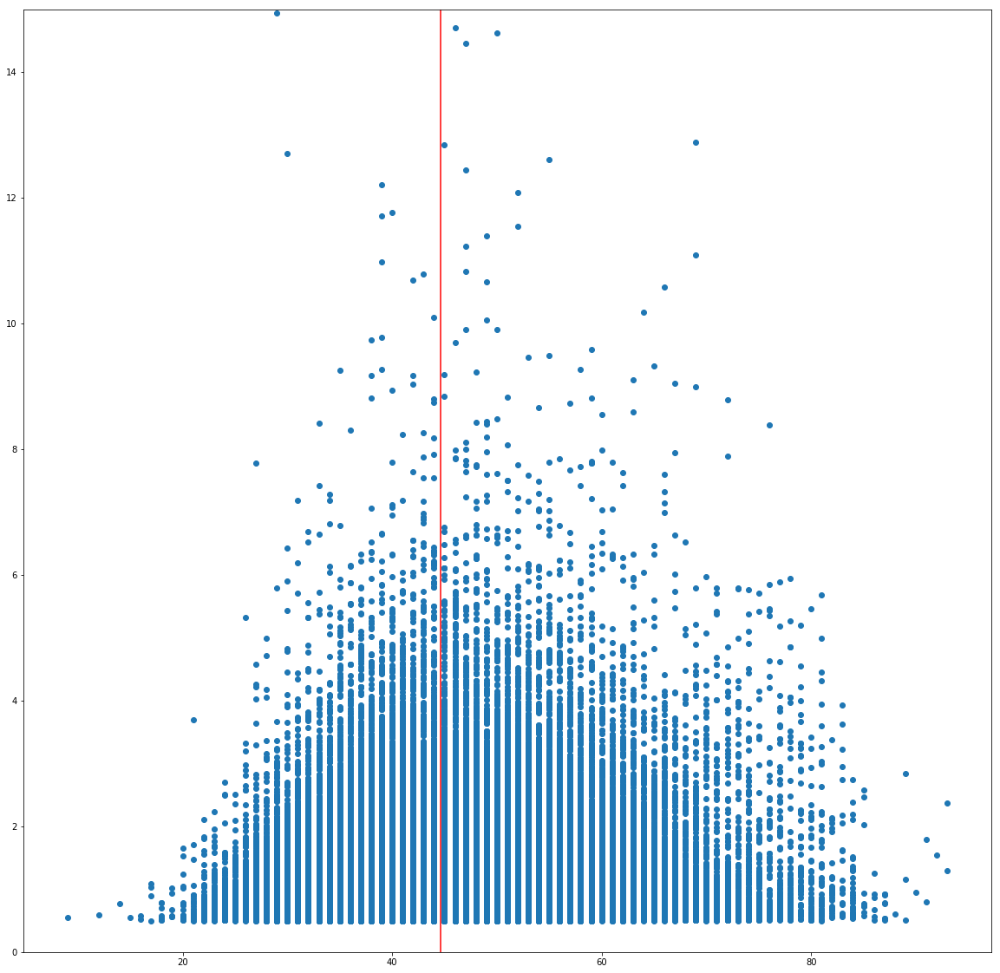

In [88]:
plt.figure(figsize=(20, 20))
plt.scatter(cg[((y_train != 0).astype(int) + (y_train != 1).astype(int)) == 2], mean_sig_train[((y_train != 0).astype(int) + (y_train != 1).astype(int)) == 2])
plt.axvline(x=44.6, color="red")
plt.ylim(0, 15)

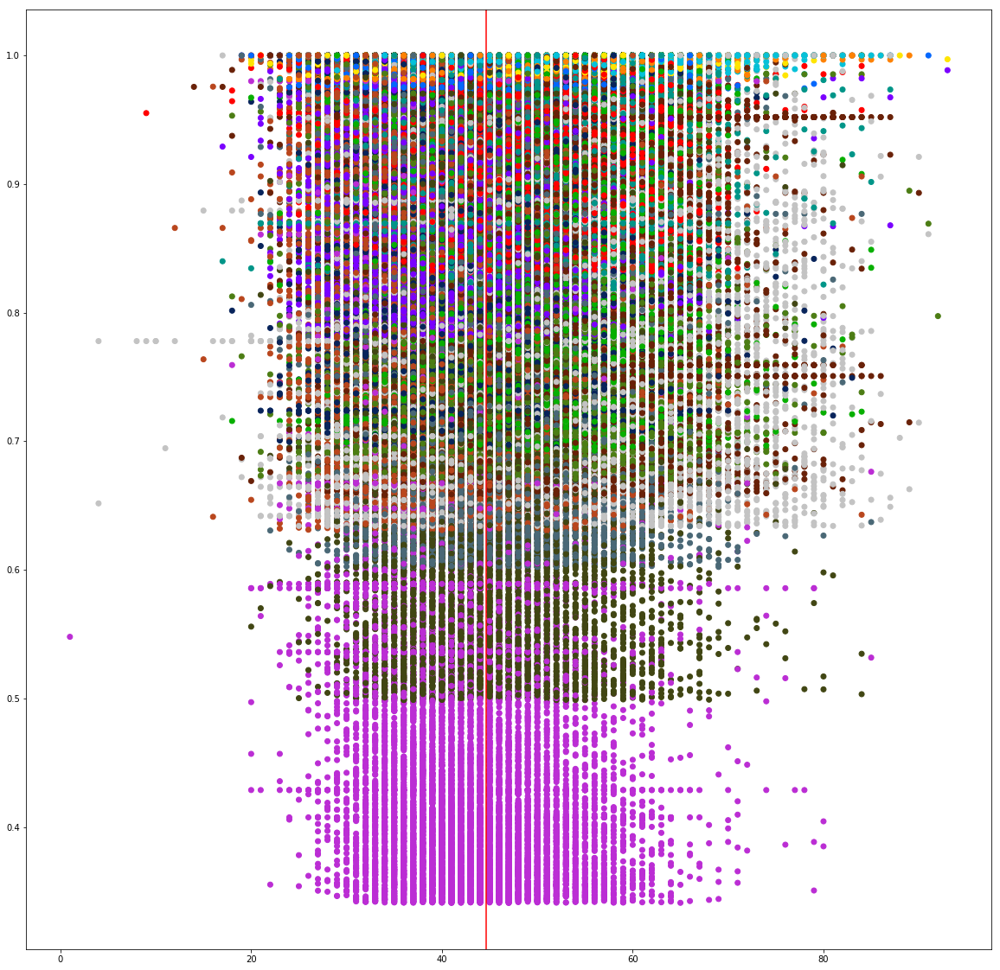

In [62]:
plt.figure(figsize=(20, 20))
cmap = mpl.colors.ListedColormap(utils.get_dhs_colors())
plt.scatter(cg, nmf_train.max(1)/(nmf_train.sum(1)), c=y_train, cmap=cmap)
plt.axvline(x=44.6, color="red")

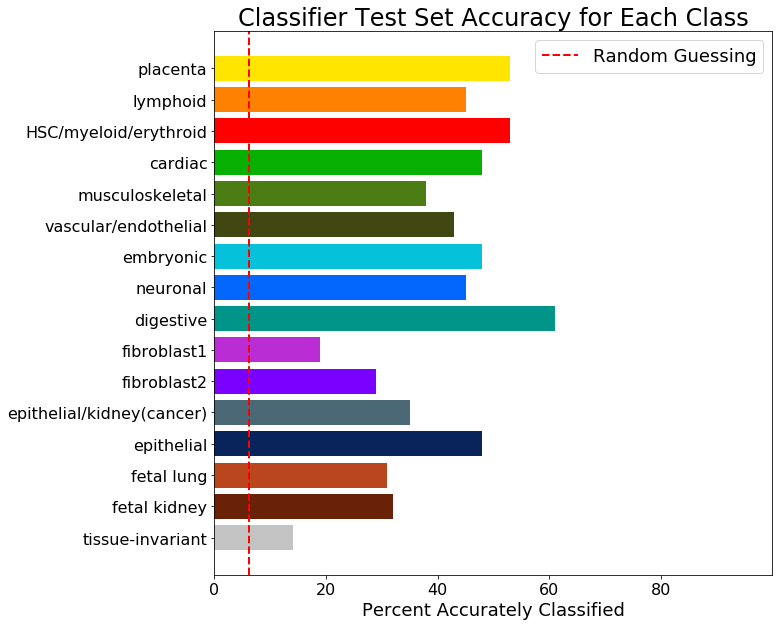

In [13]:
cm = np.load("/home/pbromley/generative_dhs/notebooks/cm.npy")
plt.figure(figsize=(10, 10))
plt.barh(np.arange(16), cm.max(1)[(utils.get_order()-1)[::-1]], color=utils.get_dhs_colors()[(utils.get_order()-1)[::-1]])
plt.yticks(np.arange(16), utils.get_component_class_names()[::-1], fontsize=16)
plt.xticks(np.arange(0, 1, 0.2), np.arange(0, 100, 20), fontsize=16)
plt.xlim(0.0, 1.0)
plt.axvline(x=0.0625, linestyle="--", linewidth=2, c="red", label="Random Guessing")
plt.title("Classifier Test Set Accuracy for Each Class", fontsize=24)
plt.xlabel("Percent Accurately Classified", fontsize=18)
plt.legend(fontsize=18)
plt.savefig("/home/pbromley/generative_dhs/figures/classifier/acc_per_class.pdf", format='pdf', bbox_inches='tight')

In [34]:
cm

array([[ 0.14,  0.01,  0.05,  0.05,  0.07,  0.03,  0.05,  0.1 ,  0.06,
         0.08,  0.08,  0.08,  0.06,  0.06,  0.05,  0.02],
       [ 0.01,  0.15,  0.03,  0.21,  0.06,  0.04,  0.06,  0.07,  0.04,
         0.03,  0.07,  0.07,  0.02,  0.05,  0.04,  0.05],
       [ 0.03,  0.01,  0.48,  0.02,  0.05,  0.02,  0.05,  0.06,  0.04,
         0.07,  0.02,  0.03,  0.03,  0.04,  0.05,  0.02],
       [ 0.  ,  0.08,  0.02,  0.32,  0.05,  0.04,  0.07,  0.05,  0.03,
         0.02,  0.06,  0.07,  0.02,  0.05,  0.05,  0.04],
       [ 0.01,  0.01,  0.04,  0.04,  0.5 ,  0.03,  0.04,  0.04,  0.03,
         0.04,  0.03,  0.02,  0.03,  0.04,  0.08,  0.03],
       [ 0.01,  0.04,  0.03,  0.07,  0.06,  0.38,  0.06,  0.04,  0.03,
         0.04,  0.03,  0.03,  0.04,  0.05,  0.03,  0.05],
       [ 0.01,  0.01,  0.04,  0.05,  0.04,  0.03,  0.56,  0.04,  0.03,
         0.02,  0.02,  0.02,  0.03,  0.02,  0.04,  0.03],
       [ 0.01,  0.01,  0.06,  0.03,  0.05,  0.02,  0.04,  0.43,  0.05,
         0.04,  0.06,  0.0

In [30]:
0.0625*16

1.0

In [75]:
motif = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/" + utils.get_motif_from_comp(4))[:, np.array([0, 3, 1, 2])]
m = utils.MotifMatchLong(motif)

In [84]:
normal, rc = m(torch.from_numpy(one_hot_seqs[0].reshape(1, 1, 100, 4)).float())

In [97]:
np.where(rc.squeeze() > 6.0)

(array([27, 28, 46, 73, 74, 78, 79, 80]),)

In [111]:
import os

In [284]:
def rainbow_text(x, y, strings, colors, boxes, ax=None, **kw):
    if ax is None:
        ax = plt.gca()
    t = ax.transData
    canvas = ax.figure.canvas

    # horizontal version
    for s, c, b in zip(strings, colors, boxes):
        text = ax.text(x, y, s, color=c, transform=t, bbox=b, fontsize=18, family='monospace', **kw)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        t = transforms.offset_copy(text._transform, x=ex.width, units="dots")

def split_seq_helper(seq, c):
    s = seq.reshape(1, 1, 100, 4)
    raw_seq = utils.one_hot_to_seq(seq)
    motif = utils.get_motif_from_comp(c, ext=True)
    motif_mat = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/" + motif)[:, np.array([0, 3, 1, 2])]
    m = utils.MotifMatch(motif_mat, where=True)
    strength, idx, strand = m(torch.from_numpy(s).float())
    col = "green"
    if strand == "-":
        idx -= (motif_mat.shape[0]-1)
        col = "red"
    
    l = max(idx, 0)
    r = min(idx+motif_mat.shape[0], 100)
    before = raw_seq[0:l]
    highlight = raw_seq[l:r]
    after = raw_seq[r:]

    high = utils.get_rough_motif_ranges()[c][1]
    low = utils.get_rough_motif_ranges()[c][0]
    strength_norm = (strength-low)/(high-low)
    strength_norm = max(strength_norm, 0)
    strength_norm = min(strength_norm, 1)
    return [(before, "black", None), (highlight, col, {'facecolor':'yellow', 'alpha':strength_norm}), (after, "black", None)]


def plot_seq(seq, c, pos):
    split = split_seq_helper(seq, c)
    l1, l2, l3 = [], [], []
    for i in range(len(split)):
        l1 += [split[i][0]]
        l2 += [split[i][1]]
        l3 += [split[i][2]]
    rainbow_text(0, 0.0206*pos, l1, l2, l3)

In [ ]:
for i, order in enumerate(utils.get_order()):
    plt.plot([-0.005, -0.005], [0.982-(i*(0.982/16)), 0.982-((i+1)*(0.982/16))], color=utils.get_dhs_colors()[order-1], linewidth=7)

In [133]:
start_scans = np.zeros((16, 10))
start_zs = np.load("/home/pbromley/generative_dhs/data_numpy/fixed_zs_100.npy")
start_one_hots = G(torch.from_numpy(start_zs[:10]).float().cuda()).detach().cpu().numpy()

    

In [134]:
for i in range(16):
    for j in range(10):
        scan = utils.get_motif_scan(comp=i, x=start_one_hots[j])
        start_scans[i, j] = scan

In [135]:
start_scans

array([[  7.11926937,   8.44569302,   7.50176239,   7.59225798,
          8.45873356,   7.24301243,   6.84249687,   7.53394175,
          9.12954521,   9.18554306],
       [  5.29531527,   5.50815201,   6.23827267,   4.63936186,
          4.83533573,   4.98258305,   5.38419294,   5.25817394,
          4.49254131,   5.46364689],
       [  7.72222185,   8.25      ,   6.79629374,   6.57407379,
          8.07407284,   7.52777719,   7.25925779,   7.12962866,
          6.70370197,   8.09901905],
       [  5.29531527,   5.50815201,   6.23827267,   4.63936186,
          4.83533573,   4.98258305,   5.38419294,   5.25817394,
          4.49254131,   5.46364689],
       [  8.07355118,   7.72321367,   7.56152296,   8.40633965,
          8.68953514,   9.18202782,   8.47490501,   9.18564701,
          7.27137613,  10.10317993],
       [  6.6629014 ,   6.55674076,   7.56655502,   5.97516727,
          6.16712475,   6.72411585,   8.4826746 ,   6.28423882,
          4.20339584,   7.67599154],
       [  

In [136]:
end_scans = np.zeros((16, 10))
for i in np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14]):
    for j in range(10):
        seq = os.popen("tail -n 1 /home/pbromley/generative_dhs/notebooks/track/{0}-{1}.txt".format(j, i+1)).read()[:-1]
        oh = utils.seq_to_one_hot(seq).reshape(1, 1, 100, 4)
        end_scans[i, j] = utils.get_motif_scan(comp=i, x=oh)
    

In [151]:
(end_scans[np.array([4, 8, 12])] - start_scans[np.array([4, 8, 12])]).argsort(1)

array([[9, 3, 8, 0, 5, 4, 7, 2, 1, 6],
       [6, 7, 9, 1, 2, 8, 3, 5, 4, 0],
       [3, 2, 1, 7, 6, 0, 5, 4, 9, 8]])

In [156]:
utils.one_hot_to_seq(start_one_hots[9].squeeze())

Seq('GGAGGGGTCTCATTTTGGCTTCCACCTACTGGTTTCCGTTTAATTACTGAGATT...TAT', SingleLetterAlphabet())

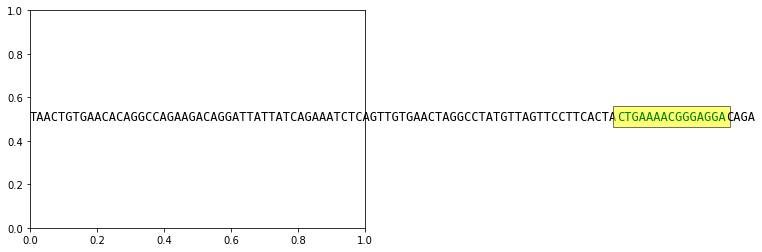

In [172]:
plot_seq(start_one_hots[0].squeeze(), 4, 24)

In [245]:
seq = os.popen("tail -n 1 /home/pbromley/generative_dhs/notebooks/track/6-5.txt").read()[:-1]
oh = utils.seq_to_one_hot(seq).reshape(1, 1, 100, 4)

In [246]:
motif = np.loadtxt("/home/pbromley/generative_dhs/memes/new_memes/" + utils.get_motif_from_comp(4))[:, np.array([0, 3, 1, 2])]
m = utils.MotifMatchLong(motif)
normal, rc = m(torch.from_numpy(oh.reshape(1, 1, 100, 4)).float())
n, r = m(torch.from_numpy(start_one_hots[6].reshape(1, 1, 100, 4)))

In [253]:
print(np.where(normal.squeeze() > 10.0))
print(np.where(rc.squeeze() > 10.0))
print("")
print(np.where(n.squeeze() > 8.0))
print(np.where(r.squeeze() > 8.0))

(array([93]),)
(array([], dtype=int64),)

(array([72, 87]),)
(array([], dtype=int64),)


In [190]:
rc.squeeze()[32]

8.997366

In [227]:
def make_col_arr(seq, idxs, rc, motif_len, strength, c):
    cols = []
    track = 0
    for i in range(len(idxs)):
        idx = idxs[i]
        color = "green"
        idx -= (motif_len-1)
        if rc[i] == "-":
            idx = 99-idx
            color = "red"
        idx = max(0, idx)
        idx = min(99, idx)
        cols.append((seq[track:idx], "black", None))
        cols.append((seq[idx:idx+motif_len], color, {'facecolor':utils.get_dhs_colors()[c], 'alpha':strength[i]}))
        track = idx+motif_len
        
    cols.append((seq[track:], "black", None))
    return cols
        

In [289]:
split = make_col_arr(utils.one_hot_to_seq(start_one_hots[6].squeeze()), [72, 87], ["+", "+"], 15, [(n.squeeze()[72]-8)/11, (n.squeeze()[87]-8)/3], 4)
split2 = make_col_arr(seq, [93], ["+"], 15, [(normal.squeeze()[93]-8)/3], 4)


In [290]:
def plot_seq(split, pos):
    l1, l2, l3 = [], [], []
    for i in range(len(split)):
        l1 += [split[i][0]]
        l2 += [split[i][1]]
        l3 += [split[i][2]]
    rainbow_text(0, 0.0206*pos, l1, l2, l3)


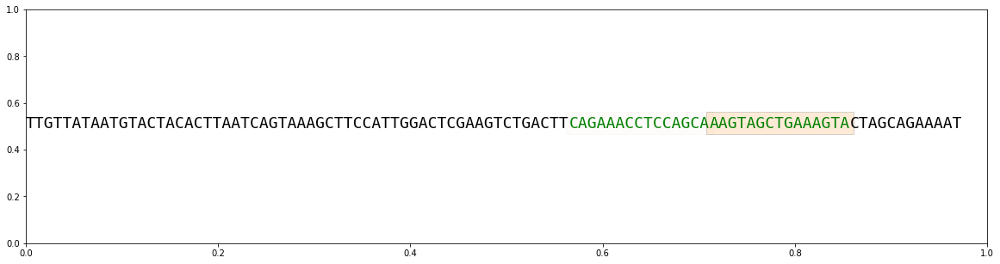

In [291]:
plt.figure(figsize=(20, 5))
plot_seq(split, 24)

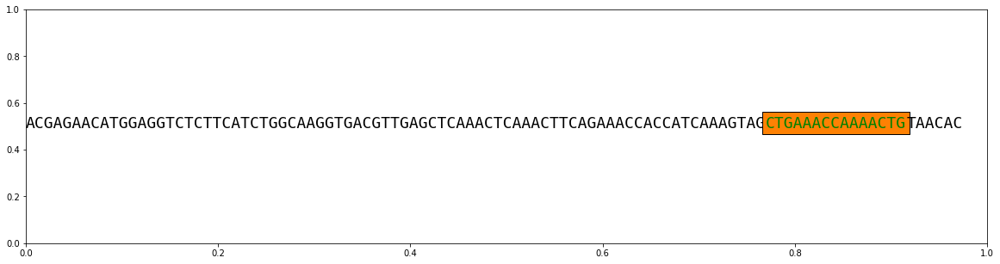

In [292]:
plt.figure(figsize=(20, 5))
plot_seq(split2, 24)

In [277]:
normal.shape

(1, 1, 114, 1)

In [280]:
normal

array([[[[  0.55594301],
         [  0.131678  ],
         [  0.515468  ],
         [  2.45842886],
         [  1.21600699],
         [  1.57679594],
         [  1.67151809],
         [  1.12667692],
         [  4.87003279],
         [  5.0949707 ],
         [  4.70991611],
         [  3.12817931],
         [  2.64951897],
         [  2.26327991],
         [  5.16452312],
         [  4.69686317],
         [  5.86133337],
         [  4.83435535],
         [  2.65950298],
         [  2.8688271 ],
         [  3.82672763],
         [  2.15678   ],
         [  3.35005903],
         [  4.39206934],
         [  1.8400991 ],
         [  3.58128119],
         [  4.86720085],
         [  1.30158401],
         [  1.29201996],
         [  3.20701814],
         [  2.110147  ],
         [  3.29006577],
         [  4.71881866],
         [  4.71959305],
         [  3.98244381],
         [  2.93487906],
         [  1.54102409],
         [  2.72692299],
         [  5.64614105],
         [  5.17363405],
